# Libs

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

from scipy import signal
from scipy.optimize import curve_fit

import random
from dataclasses import dataclass
from typing import List, Tuple, Optional
import pandas as pd

In [ ]:
import math
from tqdm import tqdm
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

In [ ]:
from astropy.io          import fits
from astropy             import units as u
from astropy.coordinates import SkyCoord
from astropy.wcs         import WCS

In [ ]:
from pathlib import Path

In [ ]:
plt.rcParams['mathtext.fontset'] = 'cm'
plt.rcParams['font.family'] = 'STIXGeneral'

# Path

In [ ]:
home_path = Path('/home/100/vn9735/')
base_path = home_path / 'tpc'
checkpoint_path = base_path / 'checkpoints'
img_path = base_path / 'figs'
checkpoint_path

PosixPath('/home/100/vn9735/tpc/checkpoints')

In [ ]:
sc_path = Path('/scratch/vp87/vn9735/')

data_path     = sc_path / 'data'
uma_data_path = data_path / 'UMA'

saury2014_data_path = data_path # 'saury'
saury_data_path = data_path # 'saury'
seta222_data_path = data_path   # 'seta'
print(checkpoint_path)
print('UMA: ', uma_data_path)
print('Saury 2014: ', saury2014_data_path)

/home/100/vn9735/tpc/checkpoints
UMA:  /scratch/vp87/vn9735/data/UMA
Saury 2014:  /scratch/vp87/vn9735/data


In [ ]:
# Data paths
training_data_file_q0 = 'Tb_n01_pw02_vs12_512_thick_256chan_quarter_0.fits'
training_data_file_q1 = 'Tb_n01_pw02_vs12_512_thick_256chan_quarter_1.fits'
training_data_file_q2 = 'Tb_n01_pw02_vs12_512_thick_256chan_quarter_2.fits'
training_data_file_q3 = 'Tb_n01_pw02_vs12_512_thick_256chan_quarter_3.fits'

training_data_file_q0 = saury2014_data_path / training_data_file_q0
training_data_file_q1 = saury2014_data_path / training_data_file_q1
training_data_file_q2 = saury2014_data_path / training_data_file_q2
training_data_file_q3 = saury2014_data_path / training_data_file_q3


rhi_file_q0 = 'R_map_n01_pw02_vs12_512px_quarter_0.fits'
rhi_file_q1 = 'R_map_n01_pw02_vs12_512px_quarter_1.fits'
rhi_file_q2 = 'R_map_n01_pw02_vs12_512px_quarter_2.fits'
rhi_file_q3 = 'R_map_n01_pw02_vs12_512px_quarter_3.fits'

rhi_file_q0 = saury2014_data_path / rhi_file_q0
rhi_file_q1 = saury2014_data_path / rhi_file_q1
rhi_file_q2 = saury2014_data_path / rhi_file_q2
rhi_file_q3 = saury2014_data_path / rhi_file_q3


fcnm_file_q0 = 'fcnm_map_n01_pw02_vs12_Tcut_500K_512px_quarter_0.fits'
fcnm_file_q1 = 'fcnm_map_n01_pw02_vs12_Tcut_500K_512px_quarter_1.fits'
fcnm_file_q2 = 'fcnm_map_n01_pw02_vs12_Tcut_500K_512px_quarter_2.fits'
fcnm_file_q3 = 'fcnm_map_n01_pw02_vs12_Tcut_500K_512px_quarter_3.fits'

fcnm_file_q0 = saury2014_data_path /  fcnm_file_q0
fcnm_file_q1 = saury2014_data_path /  fcnm_file_q1
fcnm_file_q2 = saury2014_data_path /  fcnm_file_q2
fcnm_file_q3 = saury2014_data_path /  fcnm_file_q3


print(training_data_file_q0)
print(fcnm_file_q0)
print(rhi_file_q0)


/scratch/vp87/vn9735/data/Tb_n01_pw02_vs12_512_thick_256chan_quarter_0.fits
/scratch/vp87/vn9735/data/fcnm_map_n01_pw02_vs12_Tcut_500K_512px_quarter_0.fits
/scratch/vp87/vn9735/data/R_map_n01_pw02_vs12_512px_quarter_0.fits


# Some params

In [ ]:
# Const
m_h = 1.6737236e-27
nz  = 1024
dz  = 200./nz # in pc
L = np.arange(0., nz, 1) * dz # in pc


#Velocity range and channel spacing
vmin = -40. # in km/s
vmax = 40.  # in km/s
dv   = 0.3125 # in km.s-1
v    = np.arange(vmin, vmax, dv) # Velocity axis in km/s

print(len(v))

256


# Emission data cube 0

In [ ]:
data_file = saury_data_path / 'Tb_n01_pw02_vs12_512_thick_256chan_quarter_3.fits'
cube, hdr = fits.getdata(data_file, header=True)
cube = cube[:256, :, :]
print(cube.shape)

(256, 512, 512)


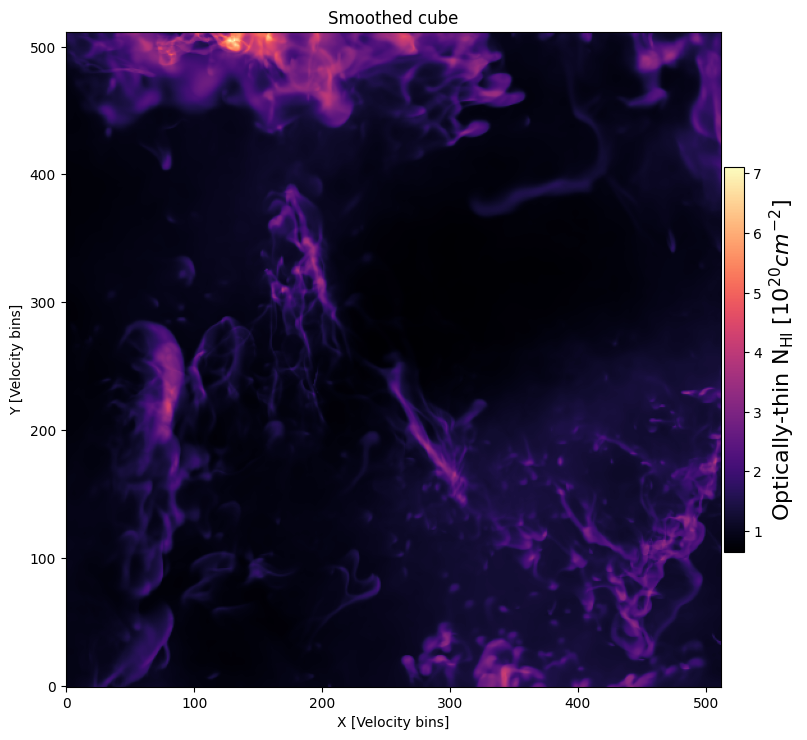

In [ ]:
WHI = np.sum(cube, axis=0)
NHI_thin = 1.8224 * 1.e-2 * WHI * dv # In unit of 10^20 cm-2

plt.figure(figsize=(10,10))

plt.imshow(NHI_thin, cmap='magma', origin='lower')

cbar = plt.colorbar(shrink=0.5, pad=0.005)
cbar.set_label(r'Optically-thin N$_\mathrm{HI}$ [10$^{20} cm^{-2}$]', size=16)

plt.title('Smoothed cube')
plt.xlabel('X [Velocity bins]')
plt.ylabel('Y [Velocity bins]')
plt.show()

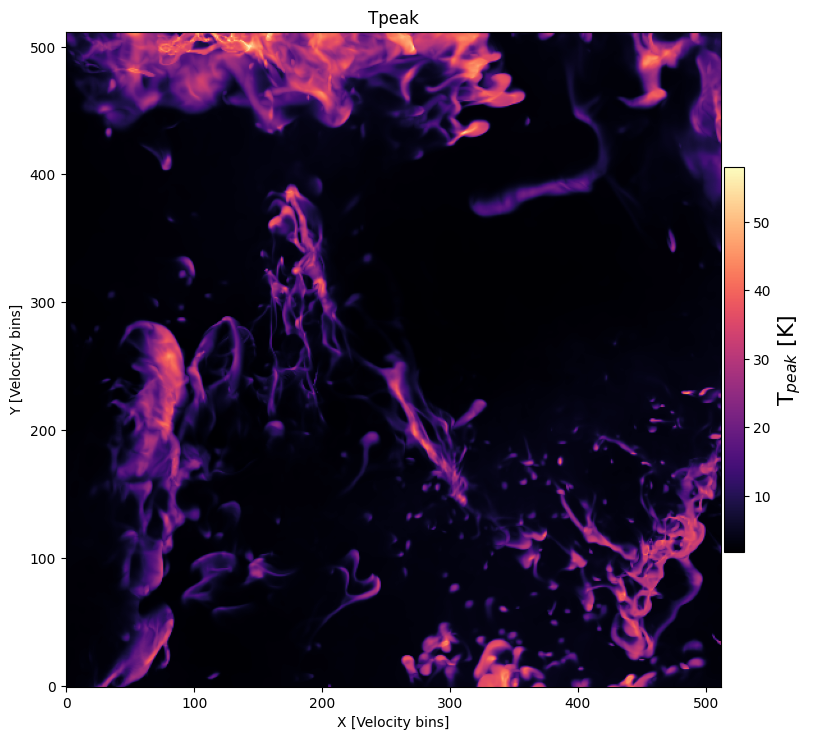

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(np.max(cube, axis=0), cmap='magma', origin='lower')

cbar = plt.colorbar(shrink=0.5, pad=0.005)
cbar.set_label('T$_{peak}$ [K]', size=16)

plt.title('Tpeak')
plt.xlabel('X [Velocity bins]')
plt.ylabel('Y [Velocity bins]')
plt.show()

## Absorption data cube

In [ ]:
tau_data_file = saury_data_path / 'tau_n01_pw02_vs12_512_thick_256chan_quarter_3.fits'
tau_cube, hdr = fits.getdata(tau_data_file, header=True)
tau_cube = tau_cube[:256, :, :]

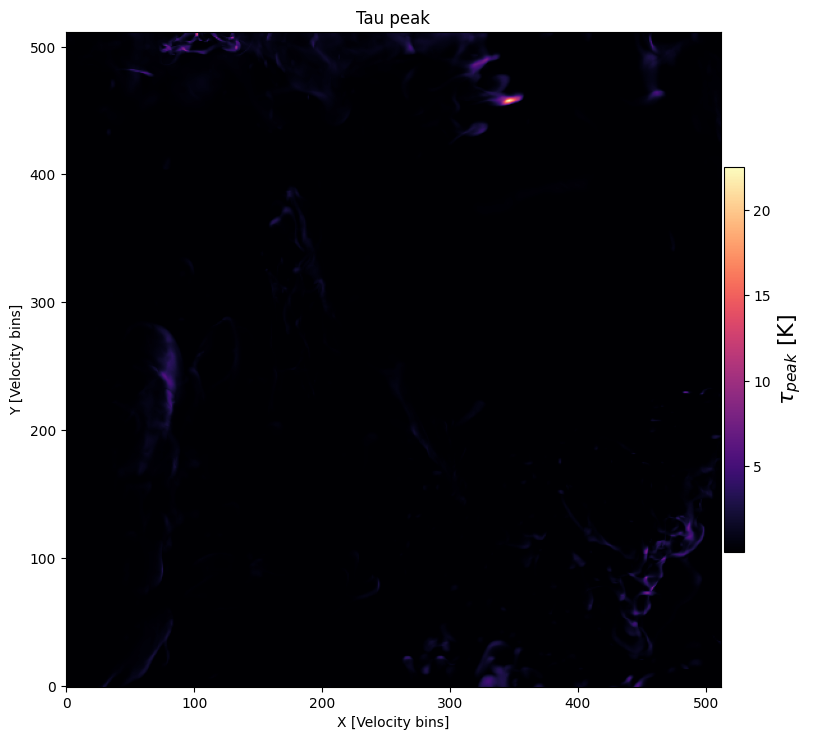

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(np.max(tau_cube, axis=0), cmap='magma', origin='lower')

cbar = plt.colorbar(shrink=0.5, pad=0.005)
cbar.set_label(r'$\tau_{peak}$ [K]', size=16)

plt.title('Tau peak')
plt.xlabel('X [Velocity bins]')
plt.ylabel('Y [Velocity bins]')
plt.show()

## Gas temperature profiles: Tspin spectra

In [ ]:
ts_cube = cube / (1. - np.exp(-tau_cube))

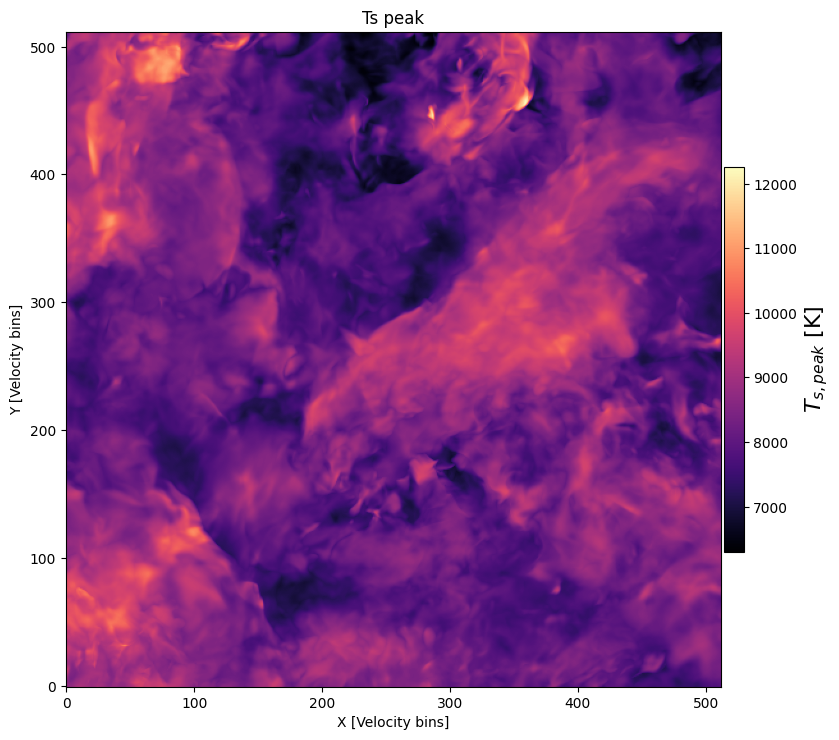

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(np.max(ts_cube, axis=0), cmap='magma', origin='lower')

cbar = plt.colorbar(shrink=0.5, pad=0.005)
cbar.set_label(r'$T_{s,peak}$ [K]', size=16)

plt.title('Ts peak')
plt.xlabel('X [Velocity bins]')
plt.ylabel('Y [Velocity bins]')
plt.show()

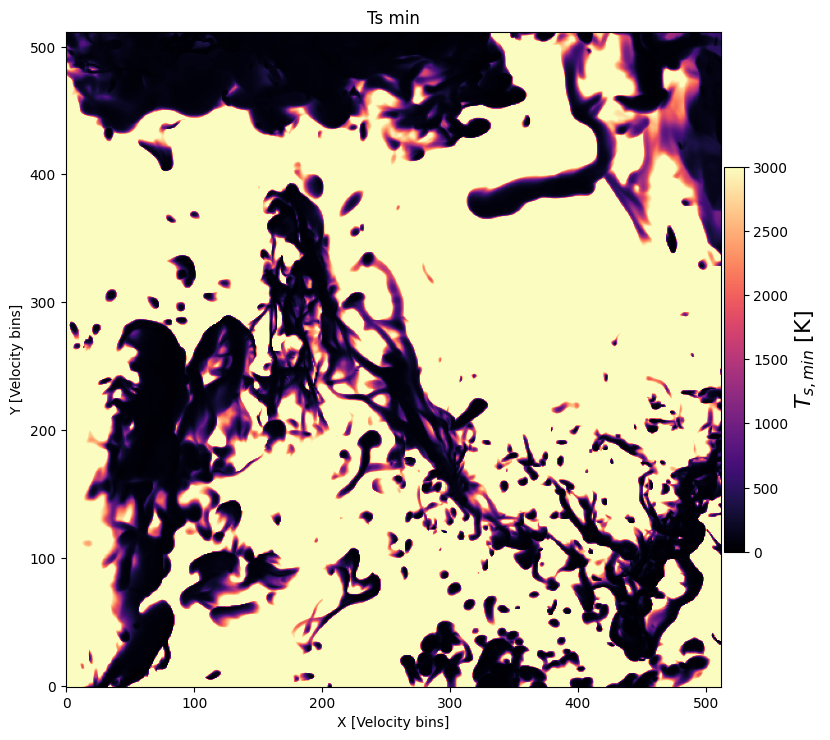

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(np.min(ts_cube, axis=0), cmap='magma', origin='lower', vmin=0., vmax=3000.)

cbar = plt.colorbar(shrink=0.5, pad=0.005)
cbar.set_label(r'$T_{s,min}$ [K]', size=16)

plt.title('Ts min')
plt.xlabel('X [Velocity bins]')
plt.ylabel('Y [Velocity bins]')
plt.show()

In [ ]:
tau_peak = np.max(tau_cube, axis=0)
tau_peak.shape

(512, 512)

In [ ]:
# tau_cube.shape
tau_peak_idx = np.argmax(tau_cube, axis=0)
tau_peak_idx

In [ ]:
tau_peak_idx.shape

(512, 512)

In [ ]:
y_indices, x_indices = np.indices(tau_peak_idx.shape)
y_indices.shape

(512, 512)

In [ ]:
ts_associated_values = ts_cube[tau_peak_idx, y_indices, x_indices]
ts_associated_values.shape

(512, 512)

In [ ]:
tau_peak_data = tau_peak.flatten()
ts_data = ts_associated_values.flatten()

In [ ]:
tau_peak_log10 = np.log10(tau_peak_data)
ts_log10 = np.log10(ts_data)

In [ ]:
ts_data.shape

(262144,)

In [ ]:
ts_expected = 28.4 * ((1. - np.exp(-tau_peak_data))**(-0.48) )
log10_ts_expected = np.log10(ts_expected)

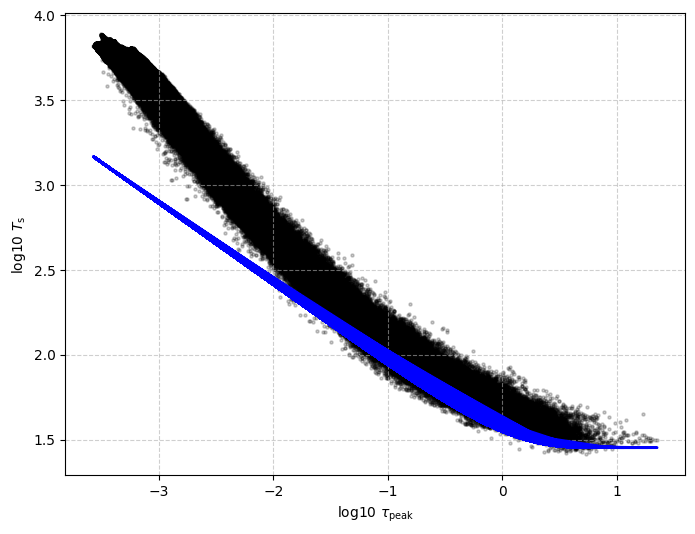

In [ ]:
# 4. Create the scatterplot
plt.figure(figsize=(8,6))

plt.scatter(
    tau_peak_log10,
    ts_log10,
    c='k',
    s=5,  # Set marker size (s) to a small value since you have many points
    alpha=0.2 # Set transparency (alpha) to manage over-plotting (density)
)

plt.plot(tau_peak_log10, log10_ts_expected, 'b-', lw=2)

# 5. Add labels and title for clarity
plt.title('')
plt.xlabel(r'log10 $\tau_\mathrm{peak}$')
plt.ylabel(r'log10 $T_\mathrm{s}$')
plt.grid(True, linestyle='--', alpha=0.6)
# plt.gca().set_aspect('equal', adjustable='box') # Optional: if you expect similar ranges

# 6. Display the plot
plt.show()

## Reshape the data cubes

In [ ]:
# Here I show the process of 1 data cube only

nchan, ny, nx = cube.shape
nspec = nx * ny

# cube_rs = cube.reshape(-1, nchan, order='C')
cube_rs = cube.reshape(nchan, ny * nx).T
tau_cube_rs = tau_cube.reshape(nchan, ny * nx).T
ts_cube_rs = ts_cube.reshape(nchan, ny * nx).T

## Plot some spectra

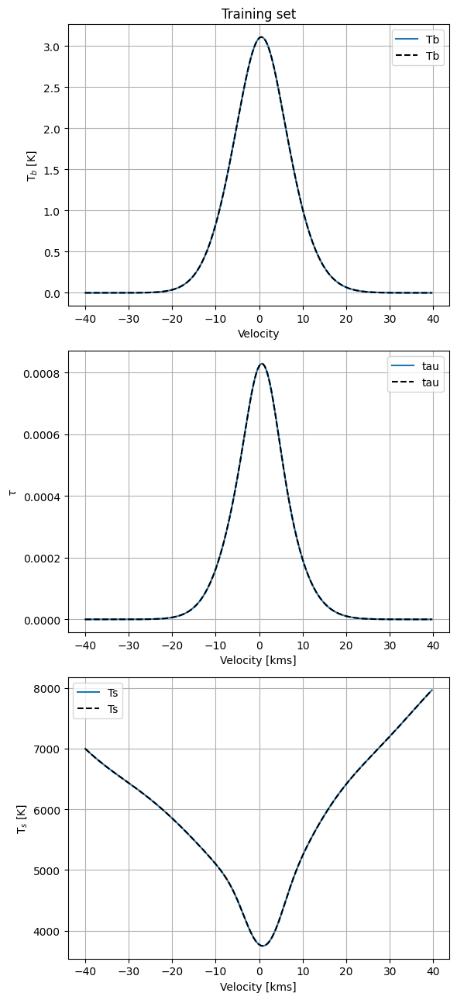

In [ ]:
i = 200
j = 100

indx = j*512 + i
#
fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(6, 13))

ax1 = axs[0]
ax1.plot(v, cube[:, j, i], label='Tb')
ax1.plot(v, cube_rs[indx, :], 'k--', label='Tb')

ax1.set_title('Training set')
ax1.set_xlabel('Velocity')
ax1.set_ylabel('T$_b$ [K]')
ax1.grid()
ax1.legend()



#
ax2 = axs[1]
ax2.plot(v, tau_cube[:, j, i], label='tau')
ax2.plot(v, tau_cube_rs[indx, :], 'k--', label='tau')

# ax2.set_title('Training set')
ax2.set_xlabel('Velocity [kms]')
ax2.set_ylabel(r'$\tau$')
ax2.grid()
ax2.legend()



#
ax3 = axs[2]
ax3.plot(v, ts_cube[:, j, i], label='Ts')
ax3.plot(v, ts_cube_rs[indx, :], 'k--', label='Ts')

# ax3.set_title('Training set')
ax3.set_xlabel('Velocity [kms]')
ax3.set_ylabel(r'T$_s$ [K]')
ax3.grid()
ax3.legend()



# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()

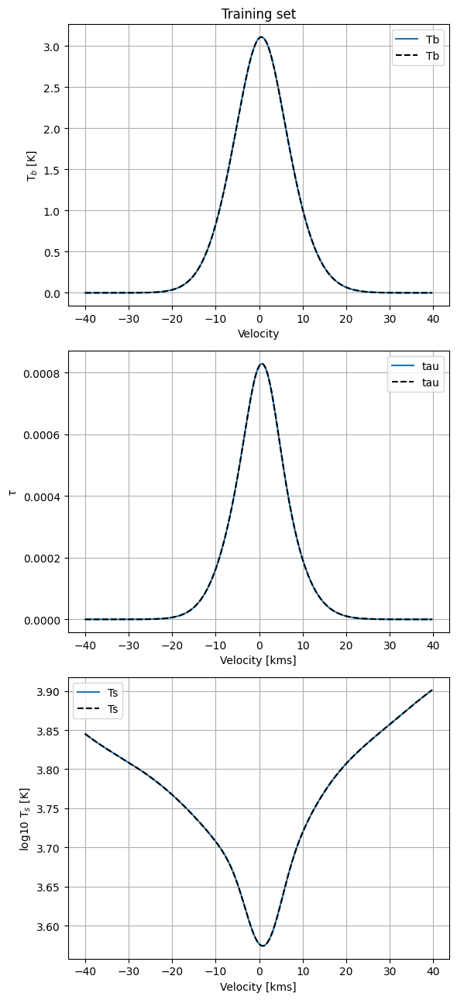

In [ ]:
i = 200
j = 100

indx = j*512 + i
#
fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(6, 13))

ax1 = axs[0]
ax1.plot(v, cube[:, j, i], label='Tb')
ax1.plot(v, cube_rs[indx, :], 'k--', label='Tb')

ax1.set_title('Training set')
ax1.set_xlabel('Velocity')
ax1.set_ylabel(r'T$_b$ [K]')
ax1.grid()
ax1.legend()



#
ax2 = axs[1]
ax2.plot(v, tau_cube[:, j, i], label='tau')
ax2.plot(v, tau_cube_rs[indx, :], 'k--', label='tau')

# ax2.set_title('Training set')
ax2.set_xlabel('Velocity [kms]')
ax2.set_ylabel(r'$\tau$')
ax2.grid()
ax2.legend()



#
ax3 = axs[2]
ax3.plot(v, np.log10(ts_cube[:, j, i]), label='Ts')
ax3.plot(v, np.log10(ts_cube_rs[indx, :]), 'k--', label='Ts')

# ax3.set_title('Training set')
ax3.set_xlabel('Velocity [kms]')
ax3.set_ylabel('log10 T$_s$ [K]')
ax3.grid()
ax3.legend()

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()

# Emission data cube 1

In [ ]:
data_file1 = saury_data_path / 'Tb_n01_pw02_vs12_512_thick_256chan_quarter_1.fits'
cube1, hdr1 = fits.getdata(data_file1, header=True)
cube1 = cube1[:256, :, :]

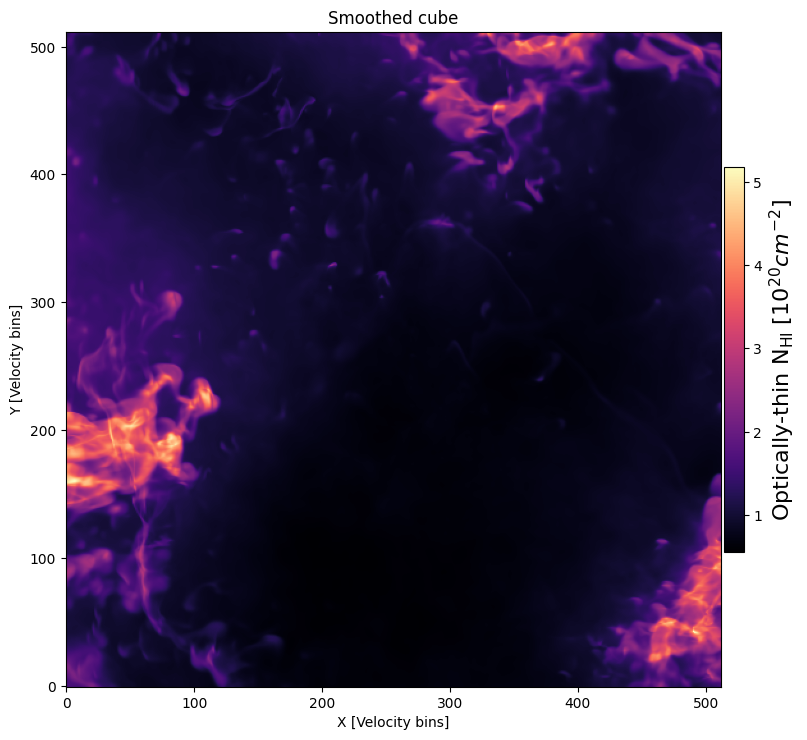

In [ ]:
WHI1 = np.sum(cube1, axis=0)
NHI1_thin = 1.8224 * 1.e-2 * WHI1 * dv # In unit of 10^20 cm-2

plt.figure(figsize=(10,10))
plt.imshow(NHI1_thin, cmap='magma', origin='lower')

cbar = plt.colorbar(shrink=0.5, pad=0.005)
cbar.set_label(r'Optically-thin N$_\mathrm{HI}$ [10$^{20} cm^{-2}$]', size=16)

plt.title('Smoothed cube')
plt.xlabel('X [Velocity bins]')
plt.ylabel('Y [Velocity bins]')
plt.show()

## Absorption data cube 1

In [ ]:
tau_data_file1 = saury_data_path / 'tau_n01_pw02_vs12_512_thick_256chan_quarter_1.fits'
tau_cube1, hdr1 = fits.getdata(tau_data_file1, header=True)
tau_cube1 = tau_cube1[:256, :, :]

tau_peak_cube1 = np.max(tau_cube1, axis=0)
tau_cube1.shape

(256, 512, 512)

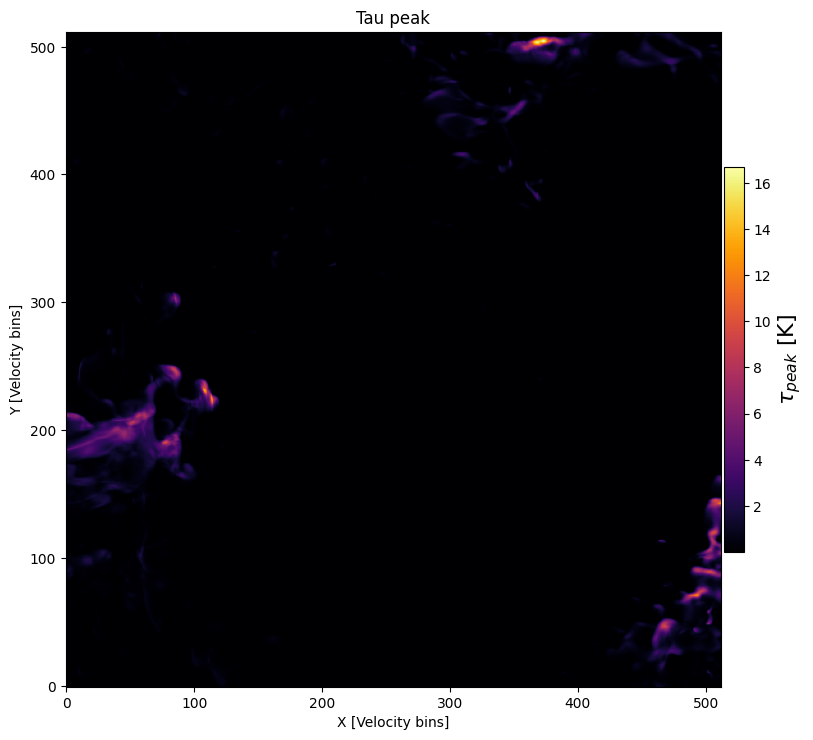

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(tau_peak_cube1, cmap='inferno', origin='lower') #, vmin=0., vmax=3.)

cbar = plt.colorbar(shrink=0.5, pad=0.005)
cbar.set_label(r'$\tau_{peak}$ [K]', size=16)

plt.title('Tau peak')
plt.xlabel('X [Velocity bins]')
plt.ylabel('Y [Velocity bins]')
plt.show()

## Gas temperature profile: Tspin spectra

In [ ]:
ts_cube1 = cube1 / (1. - np.exp(-tau_cube1))

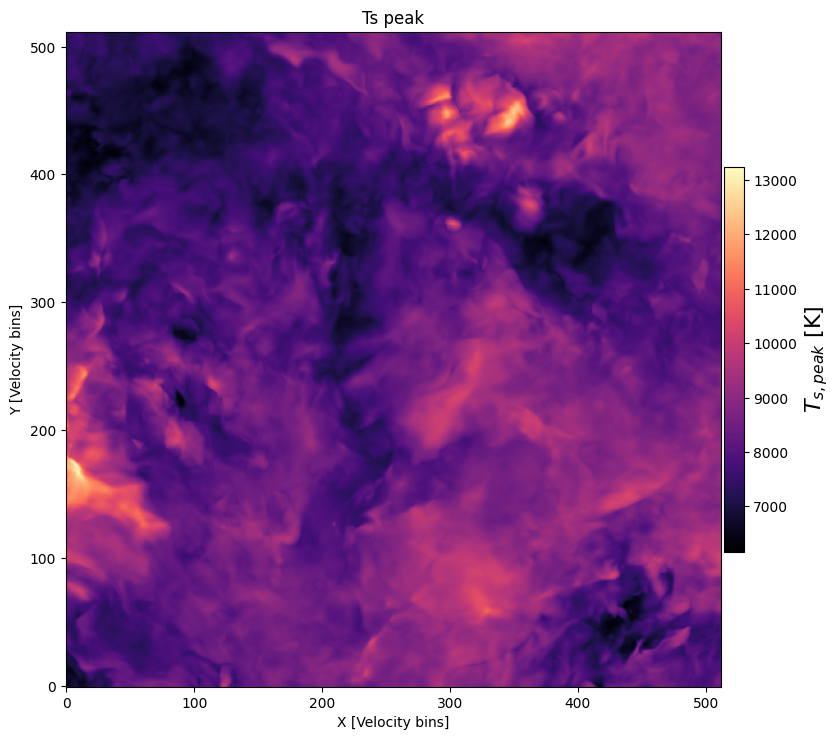

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(np.max(ts_cube1, axis=0), cmap='magma', origin='lower')

cbar = plt.colorbar(shrink=0.5, pad=0.005)
cbar.set_label(r'$T_{s,peak}$ [K]', size=16)

plt.title('Ts peak')
plt.xlabel('X [Velocity bins]')
plt.ylabel('Y [Velocity bins]')
plt.show()

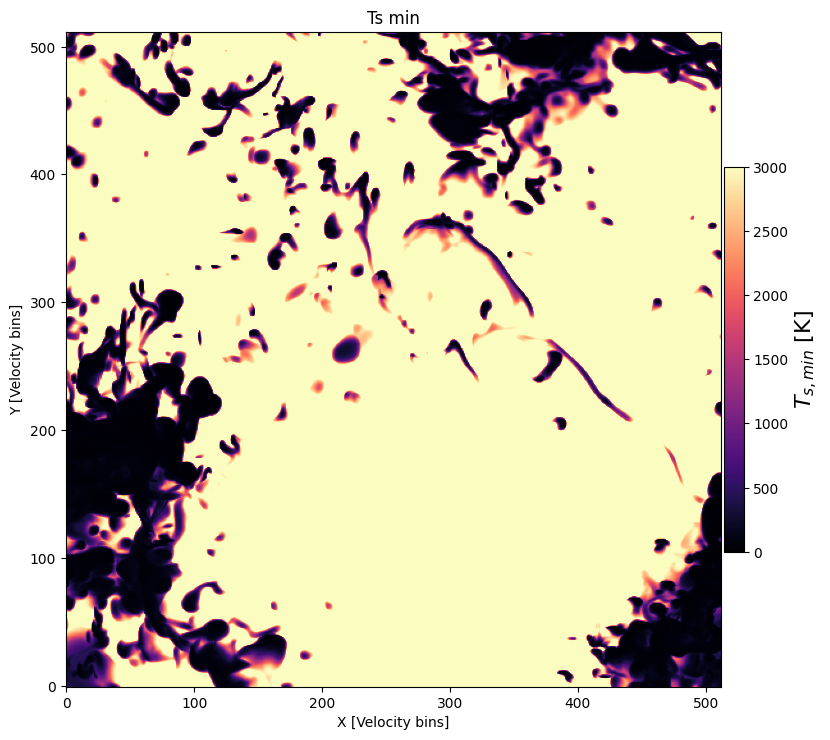

In [ ]:
plt.figure(figsize=(10,10))
plt.imshow(np.min(ts_cube1, axis=0), cmap='magma', origin='lower', vmin=0., vmax=3000.)

cbar = plt.colorbar(shrink=0.5, pad=0.005)
cbar.set_label(r'$T_{s,min}$ [K]', size=16)

plt.title('Ts min')
plt.xlabel('X [Velocity bins]')
plt.ylabel('Y [Velocity bins]')
plt.show()

In [ ]:
# Here I show the process of 1 data cube only

nchan1, ny1, nx1 = cube1.shape
nspec1 = nx1 * ny1

# cube_rs = cube.reshape(-1, nchan, order='C')
cube1_rs = cube1.reshape(nchan1, ny1 * nx1).T
tau_cube1_rs = tau_cube1.reshape(nchan1, ny1 * nx1).T
ts_cube1_rs = ts_cube1.reshape(nchan1, ny1 * nx1).T

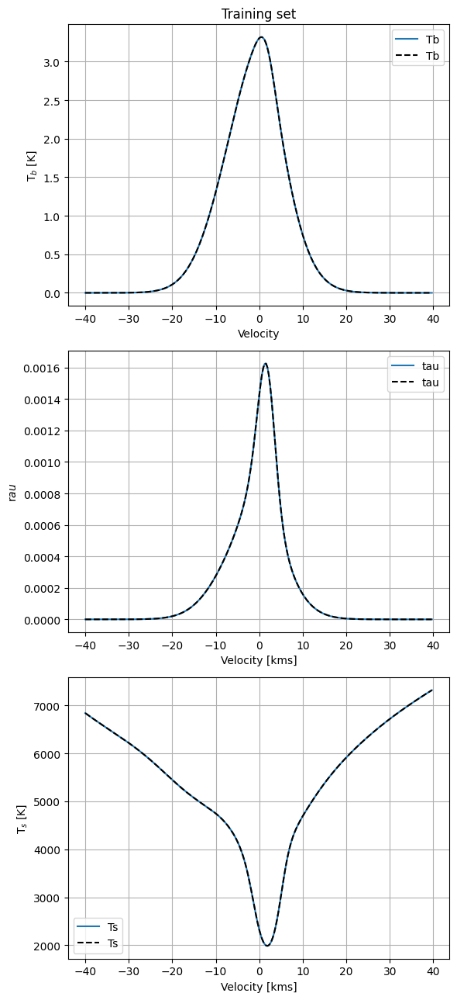

In [ ]:
i = 200
j = 300

indx = j*512 + i
#
fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(6, 13))

ax1 = axs[0]
ax1.plot(v, cube1[:, j, i], label='Tb')
ax1.plot(v, cube1_rs[indx, :], 'k--', label='Tb')

ax1.set_title('Training set')
ax1.set_xlabel('Velocity')
ax1.set_ylabel('T$_b$ [K]')
ax1.grid()
ax1.legend()



#
ax2 = axs[1]
ax2.plot(v, tau_cube1[:, j, i], label='tau')
ax2.plot(v, tau_cube1_rs[indx, :], 'k--', label='tau')

ax2.set_xlabel('Velocity [kms]')
ax2.set_ylabel('r$\tau$')
ax2.grid()
ax2.legend()



#
ax3 = axs[2]
ax3.plot(v, ts_cube1[:, j, i], label='Ts')
ax3.plot(v, ts_cube1_rs[indx, :], 'k--', label='Ts')

ax3.set_xlabel('Velocity [kms]')
ax3.set_ylabel('T$_s$ [K]')
ax3.grid()
ax3.legend()



# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()

# Combine all data cubes: Brightness emission temperatures

In [ ]:
# Combine all data cubes: more than 1 million spectra
cube_rs_all = np.concatenate([cube_rs,
                          cube1_rs],
                          axis=0)
print(cube_rs_all.shape)

(524288, 256)


In [ ]:
# Combine all data cubes: more than 1 million spectra
tau_cube_rs_all = np.concatenate([tau_cube_rs,
                          tau_cube1_rs],
                          axis=0)
print(tau_cube_rs_all.shape)

(524288, 256)


In [ ]:
tau_peak_rs_all = np.max(tau_cube_rs_all, axis=1)
tau_peak_rs_all.shape

(524288,)

In [ ]:
# Combine all data cubes: more than 1 million spectra
ts_cube_rs_all = np.concatenate([ts_cube_rs,
                          ts_cube1_rs],
                          axis=0)
print(ts_cube_rs_all.shape)

(524288, 256)


In [ ]:
np.log10(np.max(ts_cube_rs_all))

4.1220253535208045

In [ ]:
tau_peak_idx = np.argmax(tau_cube_rs_all, axis=1)
tau_peak_idx.shape

(524288,)

In [ ]:
x_indices = np.indices(tau_peak_idx.shape)
x_indices.shape

(1, 524288)

In [ ]:
ts_associated_values = ts_cube_rs_all[x_indices, tau_peak_idx]
ts_associated_values.shape

(1, 524288)

In [ ]:
tau_peak_all_data = tau_peak_rs_all.flatten()
ts_all_data = ts_associated_values.flatten()

In [ ]:
tau_peak_log10 = np.log10(tau_peak_all_data)
ts_log10 = np.log10(ts_all_data)

In [ ]:
tau_peak_vals = np.linspace(0.0001, 20, num=100)
tau_peak_vals_log10 = np.log10(tau_peak_vals)

In [ ]:
ts_expected = 28.4 * ((1. - np.exp(-tau_peak_vals))**(-0.48) )
log10_ts_expected = np.log10(ts_expected)

In [ ]:
def fit_function(x, A, B):
    """Function to fit: y = A * (1 - exp(-x))**B"""
    # Use np.exp for element-wise operation
    return A * (1.0 - np.exp(-x))**B

# Set initial guess (p0) for A and B
# A is often near the max Y value; B is a common starting point
p0 = [30., -0.5]


try:
    # Perform Non-Linear Least Squares fit
    params, covariance = curve_fit(fit_function, tau_peak_all_data, ts_all_data, p0=p0, maxfev=5000)

    A_fit, B_fit = params
    perr = np.sqrt(np.diag(covariance)) # Standard deviation errors

    print(f"\n--- FIT RESULTS ---")
    print(f"Best-fit parameters:")
    print(f"  A = {A_fit:.4f} \u00B1 {perr[0]:.4f}")
    print(f"  B = {B_fit:.4f} \u00B1 {perr[1]:.4f}")
    fit_label = f'Best Fit: $y = {A_fit:.2f} (1 - e^{{-x}})^{{{B_fit:.2f}}}$'

except RuntimeError:
    print("\n--- FIT FAILED ---")
    print("Optimization failed. Try adjusting the initial guess (p0) or bounding parameters.")
    A_fit, B_fit = float('nan'), float('nan')
    fit_label = 'Fit Failed'


--- FIT RESULTS ---
Best-fit parameters:
  A = 73.8328 ± 0.2127
  B = -0.5559 ± 0.0004


In [ ]:
ts_expected_sims = 28. * ((1. - np.exp(-tau_peak_vals))**(-0.6) )
log10_ts_expected_sims = np.log10(ts_expected_sims)

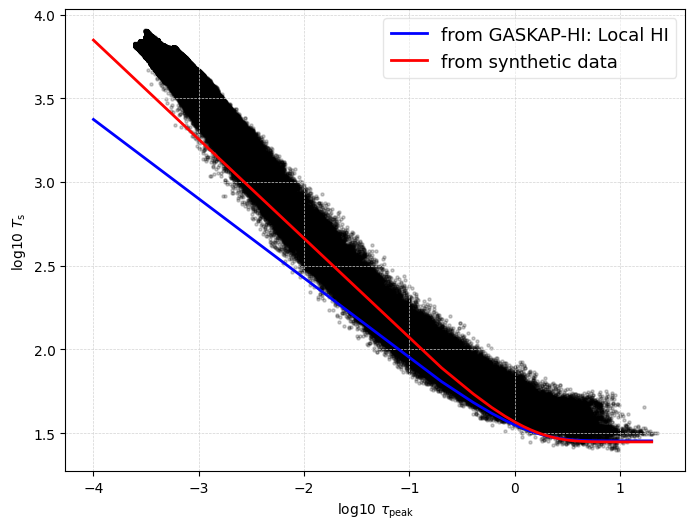

In [ ]:
plt.figure(figsize=(8,6))

plt.scatter(
    tau_peak_log10,
    ts_log10,
    c='k',
    s=5,  # Set marker size (s) to a small value since you have many points
    alpha=0.2 # Set transparency (alpha) to manage over-plotting (density)
)

plt.plot(tau_peak_vals_log10, log10_ts_expected, 'b-', lw=2, label='from GASKAP-HI: Local HI')
plt.plot(tau_peak_vals_log10, log10_ts_expected_sims, 'r-', lw=2, label='from synthetic data')

# Add labels and title
plt.title('')
plt.xlabel(r'log10 $\tau_\mathrm{peak}$')
plt.ylabel(r'log10 $T_\mathrm{s}$')
# plt.grid(True, linestyle='--', alpha=0.6)
# plt.gca().set_aspect('equal', adjustable='box') # Optional: if you expect similar ranges

plt.legend(fancybox=True, framealpha=0.5, labelcolor='k', fontsize=13) # loc='upper left'
plt.grid(True, linestyle='--', linewidth=0.5, color='lightgray', zorder=-10)

# Display the plot
plt.show()

# Physics-Informed Transformer for HI Decomposition

In [ ]:
class PositionalEncoding(nn.Module):
    """
    Positional encoding for spectral channels (velocity/frequency)
    """
    def __init__(self, d_model, max_len=512, dropout=0.1):
        super().__init__()
        self.dropout = nn.Dropout(p=dropout)

        # Create positional encoding matrix
        position = torch.arange(max_len).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2) * (-math.log(10_000.) / d_model))

        pe = torch.zeros(max_len, 1, d_model)
        pe[:, 0, 0::2] = torch.sin(position * div_term)
        pe[:, 0, 1::2] = torch.cos(position * div_term)

        self.register_buffer('pe', pe)

    def forward(self, x):
        """
        Args:
            x: Tensor shape [batch_size, seq_len, d_model]
        """
        x = x + self.pe[:x.size(1)].transpose(0, 1)
        return self.dropout(x)

In [ ]:
class PhysicsLayer(nn.Module):
    """
    HI 21cm radiative transfer physics layer.
    TB = T_HI * (1 - exp(-tau))
    """
    def __init__(self):
        super(PhysicsLayer, self).__init__()

    def forward(self, log10_T_HI, tau):
        """
        Args:
            log10_T_HI: log10 of HI spin temperature (batch, 256)
            tau: optical depth (batch, 256)
        Returns:
            TB: brightness temperature (batch, 256)
        """
        T_HI = 10.**log10_T_HI
        TB = T_HI * (1. - torch.exp(-tau))
        return TB

In [ ]:
class Encoder(nn.Module):
    """
    Encoder: emission spectrum -> latent distribution parameters
    Using Conv1D for better spectral feature extraction
    """
    def __init__(self, input_dim=256, latent_dim=64):
        super(Encoder, self).__init__()

        # Convolutional layers for spectral features
        self.conv_layers = nn.Sequential(
            nn.Conv1d(1, 32, kernel_size=5, padding=2),
        )

        # Fully connected layers
        self.fc = nn.Sequential(
            nn.Flatten(),
        )

        # Output: mean and log_variance for the latent distribution
        self.fc_mu = nn.Linear(256, latent_dim)
        self.fc_logvar = nn.Linear(256, latent_dim)

    def forward(self, x):
        # x shape: (batch, 256)
        x = x.unsqueeze(1)  # (batch, 1, 256) for Conv1d
        h = self.conv_layers(x)
        h = self.fc(h)
        mu = self.fc_mu(h)
        logvar = self.fc_logvar(h)
        # Clamp logvar to prevent numerical instability
        logvar = torch.clamp(logvar, -10, 10)
        return mu, logvar

In [ ]:
class Decoder(nn.Module):
    """
    Decoder: latent -> (log10_T_HI, tau)
    Using transposed convolutions for upsampling
    """
    def __init__(self, latent_dim=64, output_dim=256):
        super(Decoder, self).__init__()

        self.fc = nn.Sequential(
            nn.Linear(latent_dim, 256),
        )

        # Transposed conv for upsampling
        self.deconv_layers = nn.Sequential(
            nn.Unflatten(1, (128, 32)),  # (batch, 128, 32)

            nn.ConvTranspose1d(128, 128, kernel_size=4, stride=2, padding=1),  # 32 -> 64
        )

        # Separate heads for physical parameters
        self.conv_log10_T_HI = nn.Conv1d(32, 1, kernel_size=3, padding=1)
        self.conv_tau = nn.Conv1d(32, 1, kernel_size=3, padding=1)

    def forward(self, z):
        h = self.fc(z)
        h = self.deconv_layers(h)

        log10_T_HI = self.conv_log10_T_HI(h).squeeze(1)  # (batch, 256)
        log10_T_HI = torch.clamp(log10_T_HI, 0.3, 4.122) # 4.122

        tau = self.conv_tau(h).squeeze(1)  # (batch, 256)
        tau = F.softplus(tau)

        return log10_T_HI, tau

In [ ]:
class HI_VAE(nn.Module):
    """
    Variational Autoencoder for HI radiative transfer with physics layer
    """
    def __init__(self, spectrum_dim=256, latent_dim=64):
        super(HI_VAE, self).__init__()

        self.encoder = Encoder(spectrum_dim, latent_dim)
        self.decoder = Decoder(latent_dim, spectrum_dim)
        self.physics_layer = PhysicsLayer()
        self.latent_dim = latent_dim

    def reparameterize(self, mu, logvar):
        """
        Reparameterization trick: z = mu + sigma * epsilon
        """
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, TB_obs):
        """
        Forward pass through VAE
        """
        # Encode
        mu, logvar = self.encoder(TB_obs)

        # Sample from latent distribution
        z = self.reparameterize(mu, logvar)

        # Decode to physical parameters
        log10_T_HI, tau = self.decoder(z)

        # Apply physics layer
        TB_recon = self.physics_layer(log10_T_HI, tau)

        return TB_recon, log10_T_HI, tau, mu, logvar

    def sample_posterior(self, TB_obs, n_samples=512):
        """
        Sample from posterior distribution p(T_HI, tau | TB_obs)
        """
        self.eval()
        with torch.no_grad():
            mu, logvar = self.encoder(TB_obs)

            T_HI_samples = []
            tau_samples = []
            TB_samples = []

            for _ in range(n_samples):
                z = self.reparameterize(mu, logvar)
                log10_T_HI, tau = self.decoder(z)
                TB_recon = self.physics_layer(log10_T_HI, tau)

                T_HI_samples.append(10 ** log10_T_HI)
                tau_samples.append(tau)
                TB_samples.append(TB_recon)

            return (torch.stack(T_HI_samples),
                    torch.stack(tau_samples),
                    torch.stack(TB_samples))

In [ ]:
def vae_loss(TB_recon, TB_obs, log10_T_HI, tau, mu, logvar, beta=1., lambda_tspin_prior=2., lambda_smooth=1.):
    """
    VAE loss = reconstruction loss + KL divergence

    Args:
        TB_recon: reconstructed brightness temperature
        TB_obs: observed brightness temperature
        mu: latent mean
        logvar: latent log variance
        beta: weight for KL divergence (beta-VAE)
    """
    # Main reconstruction loss (MSE)
    recon_loss = nn.MSELoss()(TB_recon, TB_obs)

    # Smoothness regularization (penalize rapid changes)
    smooth_loss_T = torch.mean((log10_T_HI[:, 1:] - log10_T_HI[:, :-1])**2)
    smooth_loss_tau = torch.mean((tau[:, 1:] - tau[:, :-1])**2)
    smooth_loss = smooth_loss_T + smooth_loss_tau

    # KL divergence
    kl_loss = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())

    # Compute expected T_spin from predicted tau
    # Add small epsilon to avoid division by zero
    epsilon = 1.e-5
    factor = (1. - torch.exp(-tau)) # + epsilon
    T_spin_expected = 28. * torch.pow(factor, -0.6)
    log10_T_spin_expected = torch.log10(T_spin_expected + epsilon)

    tspin_prior_loss = torch.mean((log10_T_HI - log10_T_spin_expected)**2)

    total_loss = recon_loss + beta*kl_loss + lambda_tspin_prior*tspin_prior_loss + lambda_smooth * smooth_loss
    return total_loss, recon_loss, kl_loss, tspin_prior_loss

In [ ]:
# Dataset class
class HISpectrumDataset(Dataset):
    def __init__(self, emission_spectra, normalize=False):
        """
        Args:
            emission_spectra: numpy array of shape (n_samples, 256)
            normalize: whether to normalize the data
        """
        self.emission = torch.FloatTensor(emission_spectra)
        self.normalize = normalize

        if normalize:
            self.mean = self.emission.mean(dim=0, keepdim=True)
            self.std = self.emission.std(dim=0, keepdim=True) + 1e-8
            self.emission = (self.emission - self.mean) / self.std

    def __len__(self):
        return len(self.emission)

    def __getitem__(self, idx):
        return self.emission[idx]

    def denormalize(self, x):
        if self.normalize:
            return x * self.std + self.mean
        return x

# Training

In [ ]:
# Training function
def train_vae(model, dataloader, optimizer, device, epoch, n_epochs, beta_schedule='constant', beta_max=1.):
    model.train()
    total_loss = 0.
    total_recon = 0.
    total_kl = 0.
    total_ts_prior = 0.

    # Beta annealing
    if beta_schedule == 'linear':
        beta = min(beta_max, beta_max * epoch / (n_epochs * 0.5))
    elif beta_schedule == 'cyclical':
        cycle = epoch % (n_epochs // 4)
        beta = min(beta_max, beta_max * cycle / (n_epochs // 8))
    else:  # constant
        beta = beta_max

    for batch in dataloader:
        TB_obs = batch.to(device)

        # Forward pass
        TB_recon, log10_T_HI, tau, mu, logvar = model(TB_obs)

        # Compute loss
        loss, recon_loss, kl_loss, ts_prior_loss = vae_loss(TB_recon, TB_obs, log10_T_HI, tau, mu, logvar, beta=beta)

        # Backward pass
        optimizer.zero_grad()
        loss.backward()

        # Gradient clipping to prevent exploding gradients
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

        optimizer.step()

        total_loss += loss.item()
        total_recon += recon_loss.item()
        total_kl += kl_loss.item()
        total_ts_prior += ts_prior_loss.item()
    # End - for: batch

    n_batches = len(dataloader)
    return total_loss/n_batches, total_recon/n_batches, total_kl/n_batches, total_ts_prior/n_batches, beta

In [ ]:
def validate(model, dataloader, device, beta=1.):
    """Validation function"""
    model.eval()

    total_loss = 0.
    total_recon = 0.
    total_kl = 0.
    total_ts_prior = 0.

    with torch.no_grad():
        for batch in dataloader:
            TB_obs = batch.to(device)
            TB_recon, log10_T_HI, tau, mu, logvar = model(TB_obs)

            # Compute loss
            # loss, recon_loss, kl_loss = vae_loss(TB_recon, TB_obs, mu, logvar, beta)
            loss, recon_loss, kl_loss, ts_prior_loss = vae_loss(TB_recon, TB_obs, log10_T_HI, tau, mu, logvar, beta=beta)

            total_loss += loss.item()
            total_recon += recon_loss.item()
            total_kl += kl_loss.item()
            total_ts_prior += ts_prior_loss.item()
        # End - for: batch
    # End - with

    n_batches = len(dataloader)
    return total_loss/n_batches, total_recon/n_batches, total_kl/n_batches, total_ts_prior/n_batches

In [ ]:
def train_model(model, train_loader, val_loader, lr=0.001, device='cuda', num_epochs=100, beta_schedule='constant', beta_max=1.):
    """
    Training loop for the physics-constrained autoencoder.
    """
    model = model.to(device)

    # Use Adam with weight decay
    # optimizer = optim.Adam(model.parameters(), lr=lr)
    optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-5)

    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min',
                                                      factor=0.5, patience=5)

    history = {
        'total_loss': [],
        'recon_loss': [],
        'kl_loss': [],
        'ts_prior_loss': [],

        'val_total_loss': [],
        'val_recon_loss': [],
        'val_kl_loss': [],
        'val_ts_prior_loss': [],
    }

    # Training loop
    print("Training VAE...")
    best_val_loss = float('inf')

    for epoch in range(num_epochs):
        epoch_losses = {'total': 0., 'recon': 0., 'smooth': 0., 'sparse': 0., 'kl':0., 'ts_prior': 0.,
                       'val_total': 0., 'val_recon': 0., 'val_smooth': 0., 'val_sparse': 0., 'val_kl':0., 'val_ts_prior': 0.}

        loss, recon, kl, ts_loss, beta = train_vae(model, train_loader, optimizer, device, epoch, num_epochs,
                                                   beta_schedule=beta_schedule, beta_max=beta_max)
        val_loss, val_recon, val_kl, val_ts = validate(model, val_loader, device, beta=beta)

        # Track losses
        epoch_losses['total'] = loss
        epoch_losses['recon'] = recon
        epoch_losses['kl'] = kl
        epoch_losses['ts_prior'] = ts_loss

        epoch_losses['val_total'] = val_loss
        epoch_losses['val_recon'] = val_recon
        epoch_losses['val_kl'] = val_kl
        epoch_losses['val_ts_prior'] = val_ts

        history['total_loss'].append(epoch_losses['total'])
        history['recon_loss'].append(epoch_losses['recon'])
        history['kl_loss'].append(epoch_losses['kl'])
        history['ts_prior_loss'].append(epoch_losses['ts_prior'])

        history['val_total_loss'].append(epoch_losses['val_total'])
        history['val_recon_loss'].append(epoch_losses['val_recon'])
        history['val_kl_loss'].append(epoch_losses['val_kl'])
        history['val_ts_prior_loss'].append(epoch_losses['val_ts_prior'])

        # Learning rate scheduling
        scheduler.step(loss)

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            torch.save(model.state_dict(), 'best_vae_model.pt')

        # Print progress
        if (epoch + 1) % 10 == 0:
            print(f"Epoch [{epoch+1}/{num_epochs}]")
            print(f"  Train: Total: {epoch_losses['total']:.4f}, Recon: {epoch_losses['recon']:.4f}")
            print(f"         KL: {epoch_losses['kl']:.4f}")
            print(f"         Ts prior: {epoch_losses['ts_prior']:.4f}")

            print(f"  Val: Total: {epoch_losses['val_total']:.4f}, Recon: {epoch_losses['val_recon']:.4f}")
            print(f"         KL: {epoch_losses['val_kl']:.4f}")
            print(f"         Ts prior: {epoch_losses['val_ts_prior']:.4f}")

            print(f"  Beta: {beta:.4f}")

    return history

In [ ]:
# GPU or CPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
ngpus = torch.cuda.device_count()
print('device: ', device)
print('device_count: ', ngpus)

device:  cuda
device_count:  1


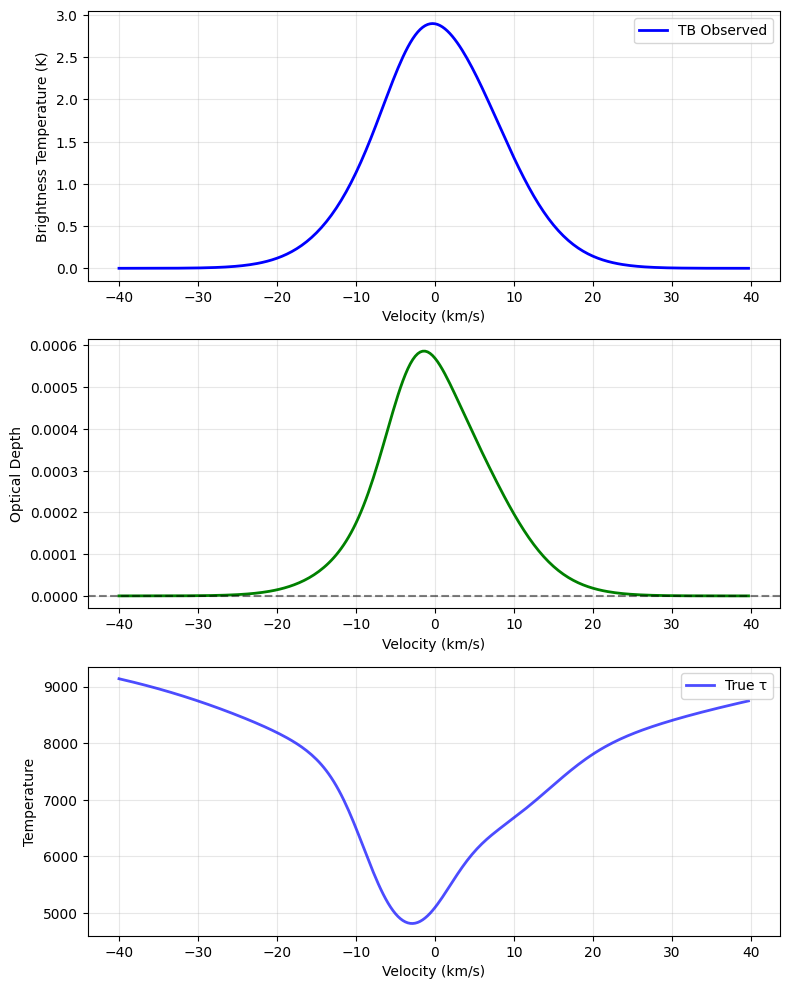

In [ ]:
fig, axes = plt.subplots(3, 1, figsize=(8,10))

idx = 10

axes[0].plot(v, cube_rs_all[idx], 'b-', label='TB Observed', linewidth=2)
axes[0].set_xlabel('Velocity (km/s)')
axes[0].set_ylabel('Brightness Temperature (K)')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

axes[1].plot(v, tau_cube_rs_all[idx], 'g-', linewidth=2)
axes[1].axhline(y=0, color='k', linestyle='--', alpha=0.5)
axes[1].set_xlabel('Velocity (km/s)')
axes[1].set_ylabel('Optical Depth')
axes[1].grid(True, alpha=0.3)

axes[2].plot(v, ts_cube_rs_all[idx], 'b-', label='True τ', linewidth=2, alpha=0.7)
axes[2].set_xlabel('Velocity (km/s)')
axes[2].set_ylabel('Temperature')
axes[2].legend()
axes[2].grid(True, alpha=0.3)

plt.tight_layout()
# plt.savefig('.png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
cube_rs_all.shape

(524288, 256)

In [ ]:
n_samples, n_channels = cube_rs_all.shape
print(f"Number of spectra: {n_samples}")
print(f"Number of channels: {n_channels}")

Number of spectra: 524288
Number of channels: 256


In [ ]:
temp_log10_spectra = np.log10(ts_cube_rs_all)
temp_log10_spectra.shape

(524288, 256)

In [ ]:
print(f"Training set: {n_samples} spectra with {n_channels} channels")
print(f"TB range: [{cube_rs_all.min():.2f}, {cube_rs_all.max():.2f}] K")
print(f"True T_HI range: [{ts_cube_rs_all.min():.2f}, {ts_cube_rs_all.max():.2f}] K")
print(f"True τ range: [{tau_cube_rs_all.min():.2f}, {tau_cube_rs_all.max():.2f}]")

Training set: 524288 spectra with 256 channels
TB range: [0.00, 58.26] K
True T_HI range: [24.52, 13244.19] K
True τ range: [0.00, 22.50]


In [ ]:
n_train = 420_000
n_val = 100_000
n_test = 2000

# Generate all possible indices
all_indices = np.arange(n_samples)

# Shuffle the indices
np.random.shuffle(all_indices)

# Split into two different sets of indices
train_indices = all_indices[:n_train]
val_indices = all_indices[n_train:(n_train + n_val)]
test_indices = all_indices[(n_train + n_val):(n_train + n_val + n_test)]


train_spectra = cube_rs_all[train_indices, :]
val_spectra = cube_rs_all[val_indices, :]
test_spectra = cube_rs_all[test_indices, :]
print(train_spectra.shape)
print(val_spectra.shape)
print(test_spectra.shape)

train_tauspectra = tau_cube_rs_all[train_indices, :]
val_tauspectra = tau_cube_rs_all[val_indices, :]
test_tauspectra = tau_cube_rs_all[test_indices, :]
print(train_tauspectra.shape)
print(val_tauspectra.shape)
print(test_tauspectra.shape)

train_tempspectra = temp_log10_spectra[train_indices, :]
val_tempspectra = temp_log10_spectra[val_indices, :]
test_tempspectra = temp_log10_spectra[test_indices, :]
print(train_tempspectra.shape)
print(val_tempspectra.shape)
print(test_tempspectra.shape)

(420000, 256)
(100000, 256)
(2000, 256)
(420000, 256)
(100000, 256)
(2000, 256)
(420000, 256)
(100000, 256)
(2000, 256)


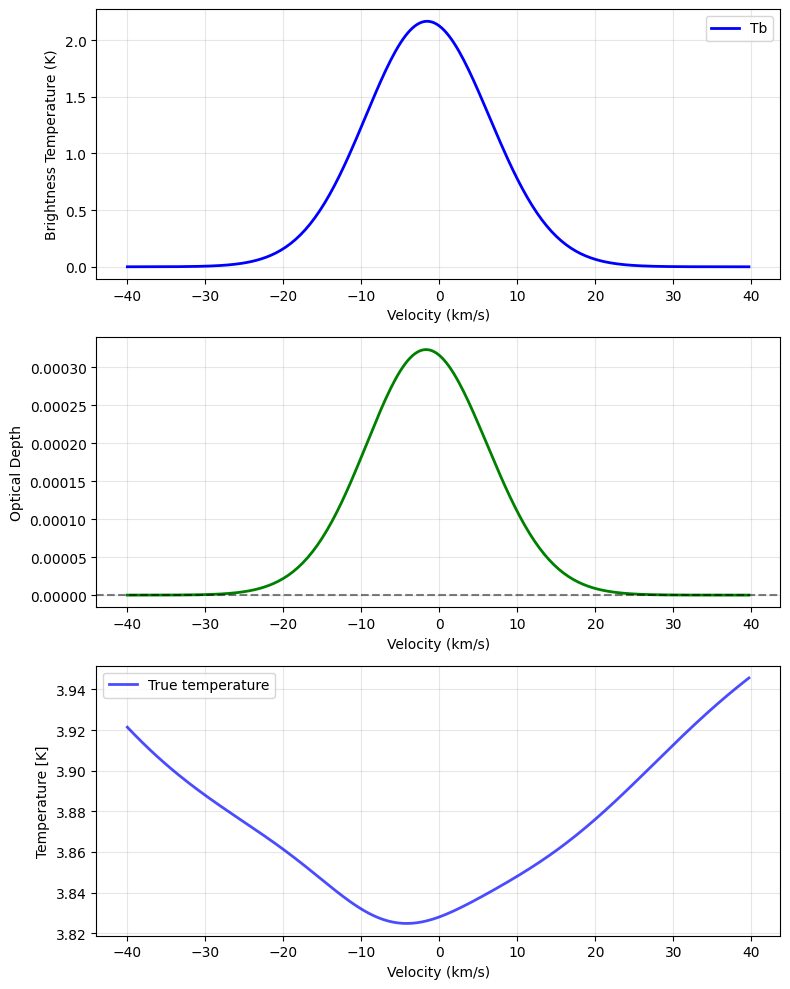

In [ ]:
fig, axes = plt.subplots(3, 1, figsize=(8, 10))

idx = 1

axes[0].plot(v, test_spectra[idx], 'b-', label='Tb', linewidth=2)
axes[0].set_xlabel('Velocity (km/s)')
axes[0].set_ylabel('Brightness Temperature (K)')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

axes[1].plot(v, test_tauspectra[idx], 'g-', linewidth=2)
axes[1].axhline(y=0, color='k', linestyle='--', alpha=0.5)
axes[1].set_xlabel('Velocity (km/s)')
axes[1].set_ylabel('Optical Depth')
axes[1].grid(True, alpha=0.3)

axes[2].plot(v, test_tempspectra[idx], 'b-', label='True temperature', linewidth=2, alpha=0.7)
axes[2].set_xlabel('Velocity (km/s)')
axes[2].set_ylabel('Temperature [K]')
axes[2].legend()
axes[2].grid(True, alpha=0.3)

plt.tight_layout()
# plt.savefig('.png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
# Hyperparameters
spectrum_dim = 256
latent_dim = 64
batch_size = 256

In [ ]:
learning_rate = 1.e-4 #
num_epochs = 33
beta_max = 0.25 # 0.5  # Start with lower beta, Lower beta_max to prioritise reconstruction
beta_schedule = 'constant'  # Use beta annealing

In [ ]:
# Create dataset and dataloader
dataset = HISpectrumDataset(train_spectra, normalize=False)
train_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

val_dataset = HISpectrumDataset(val_spectra, normalize=False)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

In [ ]:
# Initialize model
model = HI_VAE(spectrum_dim=spectrum_dim, latent_dim=latent_dim)

print(f"Model Architecture:")
print(model)
print(f"Total parameters: {sum(p.numel() for p in model.parameters()):,}")

In [ ]:
# Train model
history = train_model(model, train_loader, val_loader, lr=learning_rate, device=device, num_epochs=num_epochs, beta_schedule=beta_schedule, beta_max=beta_max)

Training VAE...
Epoch [10/33]
  Train: Total: 0.1393, Recon: 0.0821
         KL: 0.1423
         Ts prior: 0.0105
  Val: Total: 0.1151, Recon: 0.0612
         KL: 0.1305
         Ts prior: 0.0104
  Beta: 0.2500
Epoch [20/33]
  Train: Total: 0.1256, Recon: 0.0724
         KL: 0.1269
         Ts prior: 0.0105
  Val: Total: 0.1102, Recon: 0.0576
         KL: 0.1243
         Ts prior: 0.0105
  Beta: 0.2500
Epoch [30/33]
  Train: Total: 0.1196, Recon: 0.0680
         KL: 0.1211
         Ts prior: 0.0105
  Val: Total: 0.1047, Recon: 0.0538
         KL: 0.1138
         Ts prior: 0.0110
  Beta: 0.2500


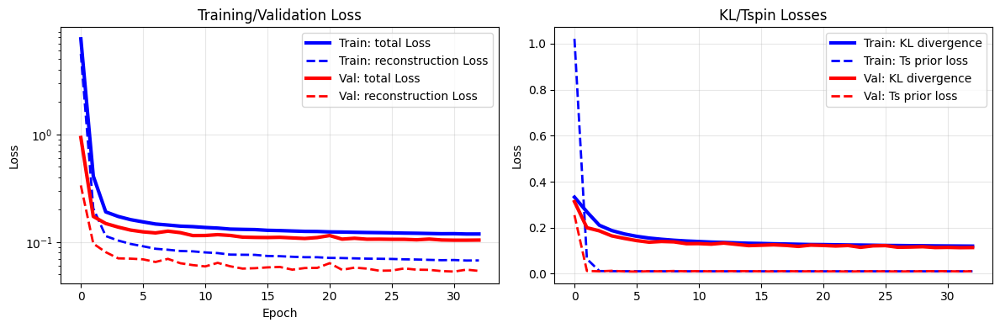

In [ ]:
# Plot training history
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history['total_loss'], 'b-', lw=3, label='Train: total Loss')
plt.plot(history['recon_loss'], 'b--', lw=2, label='Train: reconstruction Loss')

plt.plot(history['val_total_loss'], 'r-', lw=3, label='Val: total Loss')
plt.plot(history['val_recon_loss'], 'r--', lw=2, label='Val: reconstruction Loss')
plt.yscale('log')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training/Validation Loss')
plt.legend()
plt.grid(True, alpha=0.3)

plt.subplot(1, 2, 2)
plt.plot(history['kl_loss'], 'b-', lw=3, label='Train: KL divergence')
plt.plot(history['ts_prior_loss'], 'b--', lw=2, label='Train: Ts prior loss')

plt.plot(history['val_kl_loss'], 'r-', lw=3,label='Val: KL divergence')
plt.plot(history['val_ts_prior_loss'], 'r--', lw=2, label='Val: Ts prior loss')

plt.ylabel('Loss')
plt.title('KL/Tspin Losses')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
# plt.savefig('training_history.png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
sel_idx = np.where(np.max(test_spectra, axis=1) > 20.)[0]
sel_idx

In [ ]:
def visu(model, v, test_spectra, test_tauspectra, test_tempspectra, device, test_idx = 0):
    # Visualize results on a test spectrum
    print("Generating visualization...")
    print('test spectrum idx: ', test_idx)

    test_spectrum = test_spectra[test_idx]  # Use first spectrum as test
    test_tauspectrum = test_tauspectra[test_idx]
    test_tempspectrum = test_tempspectra[test_idx]




    """
    Visualize the decomposition results for a single spectrum.

    Args:
        model: Trained model
        test_spectrum: Observed TB spectrum
        T_true: True temperature spectrum (ground truth)
        tau_true: True optical depth spectrum (ground truth)
        velocities: Velocity array
        device: Computing device
    """
    model.eval()
    with torch.no_grad():
        TB_obs = torch.FloatTensor(test_spectrum).unsqueeze(0).to(device)
        T_HI_samples, tau_samples, TB_samples = model.sample_posterior(TB_obs, n_samples=512)

        # Get mean and std for uncertainty quantification
        T_HI, _ = T_HI_samples.median(dim=0)
        T_HI_std = T_HI_samples.std(dim=0)
        tau, _ = tau_samples.median(dim=0)
        tau_std = tau_samples.std(dim=0)

        TB_recon, _ = TB_samples.median(dim=0)
        TB_recon_std = TB_samples.std(dim=0)

        # Move to CPU for plotting
        TB_obs = TB_obs.cpu().numpy()[0]

        T_HI = T_HI.cpu().numpy()[0]
        T_HI_std = T_HI_std.cpu().numpy()[0]

        lower_bound_linear = T_HI - T_HI_std
        upper_bound_linear = T_HI + T_HI_std

        lower_bound_linear50 = T_HI - 50.
        upper_bound_linear50 = T_HI + 50.

        # Ensure bounds are positive before taking log10
        lower_bound_linear[lower_bound_linear <= 0] = 1e-6
        upper_bound_linear[upper_bound_linear <= 0] = 1e-6 # This should usually be fine if median and std are positive

        log10_lower_bound = np.log10(lower_bound_linear)
        log10_upper_bound = np.log10(upper_bound_linear)

        log10_lower_bound_linear50 = np.log10(lower_bound_linear50)
        log10_upper_bound_linear50 = np.log10(upper_bound_linear50)


        T_HI = np.log10(T_HI)
        # T_HI_std = np.log10(T_HI_std)

        tau = tau.cpu().numpy()[0]
        tau_std = tau_std.cpu().numpy()[0]

        TB_recon = TB_recon.cpu().numpy()[0]
        TB_recon_std = TB_recon_std.cpu().numpy()[0]
    # End - with




    # Plots
    fig, axes = plt.subplots(2, 3, figsize=(22, 10))

    fontsize = 22
    lgsize = 18

    # Plot 1: Observed vs Reconstructed
    ax = axes[0, 0]
    ax.plot(v, TB_obs, 'b-', label=r'$T_\mathrm{B}$ Observed', linewidth=2)
    ax.plot(v, TB_recon, 'r--', label=r'$T_\mathrm{B}$ Reconstructed', linewidth=2)
    ax.fill_between(v, TB_recon-TB_recon_std, TB_recon+TB_recon_std, alpha=0.3, facecolor='grey')
    ax.fill_between(v, TB_recon-1., TB_recon+1., alpha=0.3, facecolor='cyan')
    ax.set_xlabel('Velocity (km/s)', fontsize=fontsize)
    ax.set_ylabel(r'$T_\mathrm{B}$ (K)', fontsize=fontsize)

    ax.minorticks_on()
    ax.tick_params(axis='x', labelsize=fontsize, pad=4)
    ax.tick_params(axis='y', labelsize=fontsize)
    ax.tick_params(which='both', width=2)
    ax.tick_params(which='major', length=5)
    ax.tick_params(which='minor', length=3)

    ax.legend(fancybox=True, framealpha=0.5, labelcolor='k', fontsize=lgsize)
    ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray', zorder=-10)

    # Plot 2: Residuals
    ax = axes[1, 0]
    residual = TB_obs - TB_recon
    ax.plot(v, residual, 'g-', linewidth=2, label=f'Residuals (RMS: {np.sqrt(np.mean(residual**2)):.2f} K)')
    ax.axhline(y=0, color='k', linestyle='--', alpha=0.5)
    ax.axhspan(ymin=-1., ymax=1., color='gray', alpha=0.3, label=r'1$\sigma$ ~1K')

    ax.set_xlabel('Velocity (km/s)', fontsize=fontsize)
    ax.set_ylabel('Residual (K)', fontsize=fontsize)

    ax.minorticks_on()
    ax.tick_params(axis='x', labelsize=fontsize, pad=4)
    ax.tick_params(axis='y', labelsize=fontsize)
    ax.tick_params(which='both', width=2)
    ax.tick_params(which='major', length=5)
    ax.tick_params(which='minor', length=3)

    ax.legend(fancybox=True, framealpha=0.5, labelcolor='k', fontsize=fontsize)
    ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray', zorder=-10)

    # Plot 3: Predicted vs True Temperature
    ax = axes[0, 1]
    ax.plot(v, test_tempspectrum, 'b-', label='True Ts', linewidth=2, alpha=0.7)
    ax.plot(v, T_HI, 'r--', label='Predicted Ts', linewidth=2)
    ax.fill_between(v, log10_lower_bound, log10_upper_bound, alpha=0.3, facecolor='grey')
    ax.fill_between(v, log10_lower_bound_linear50, log10_upper_bound_linear50, alpha=0.3, facecolor='cyan')
    ax.set_xlabel('Velocity (km/s)', fontsize=fontsize)
    ax.set_ylabel('(log10) Temperature (K)', fontsize=fontsize)

    ax.minorticks_on()
    ax.tick_params(axis='x', labelsize=fontsize, pad=4)
    ax.tick_params(axis='y', labelsize=fontsize)
    ax.tick_params(which='both', width=2)
    ax.tick_params(which='major', length=5)
    ax.tick_params(which='minor', length=3)

    ax.legend(fancybox=True, framealpha=0.5, labelcolor='k', fontsize=lgsize)
    ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray', zorder=-10)

    # Plot 4: Predicted vs True Optical Depth
    ax = axes[0, 2]
    axes[0, 2].plot(v, test_tauspectrum, 'b-', label='True τ', linewidth=2, alpha=0.7)
    axes[0, 2].plot(v, tau, 'r--', label='Predicted τ', linewidth=2)
    ax.fill_between(v, tau-tau_std, tau+tau_std, alpha=0.3, facecolor='grey')
    ax.fill_between(v, tau-0.05, tau+0.05, alpha=0.3, facecolor='cyan')
    axes[0, 2].set_xlabel('Velocity (km/s)', fontsize=fontsize)
    axes[0, 2].set_ylabel('Optical Depth', fontsize=fontsize)

    ax.minorticks_on()
    ax.tick_params(axis='x', labelsize=fontsize, pad=4)
    ax.tick_params(axis='y', labelsize=fontsize)
    ax.tick_params(which='both', width=2)
    ax.tick_params(which='major', length=5)
    ax.tick_params(which='minor', length=3)

    ax.legend(fancybox=True, framealpha=0.5, labelcolor='k', fontsize=lgsize)
    ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray', zorder=-10)

    # Plot 5: Temperature Error
    T_error = T_HI - test_tempspectrum

    ax = axes[1, 1]
    ax.plot(v, T_error, 'purple', linewidth=2, label=f'log10 Ts Error (RMS: {np.sqrt(np.mean(T_error**2)):.2f} K)')
    ax.axhline(y=0, color='k', linestyle='--', alpha=0.5)
    ax.fill_between(v, (log10_lower_bound_linear50-T_HI), (log10_upper_bound_linear50-T_HI), alpha=0.3, facecolor='cyan')

    ax.set_xlabel('Velocity (km/s)', fontsize=fontsize)
    ax.set_ylabel('(log10) Temperature Error (K)', fontsize=fontsize)

    ax.minorticks_on()
    ax.tick_params(axis='x', labelsize=fontsize, pad=4)
    ax.tick_params(axis='y', labelsize=fontsize)
    ax.tick_params(which='both', width=2)
    ax.tick_params(which='major', length=5)
    ax.tick_params(which='minor', length=3)

    ax.legend(loc='upper left', fancybox=True, framealpha=0.5, labelcolor='k', fontsize=fontsize)
    ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray', zorder=-10)




    # Plot 6: Optical Depth Error
    tau_error = tau - test_tauspectrum

    ax = axes[1, 2]
    ax.plot(v, tau_error, 'orange', linewidth=2, label=f'τ Error (RMS: {np.sqrt(np.mean(tau_error**2)):.2f})')
    ax.axhline(y=0, color='k', linestyle='--', alpha=0.5)
    ax.axhspan(ymin=-0.05, ymax=0.05, color='gray', alpha=0.3, label=r'1$\sigma \sim 0.05$')


    ax.set_xlabel('Velocity (km/s)', fontsize=fontsize)
    ax.set_ylabel('Optical Depth Error', fontsize=fontsize)

    ax.minorticks_on()
    ax.tick_params(axis='x', labelsize=fontsize, pad=4)
    ax.tick_params(axis='y', labelsize=fontsize)
    ax.tick_params(which='both', width=2)
    ax.tick_params(which='major', length=5)
    ax.tick_params(which='minor', length=3)

    ax.legend(fancybox=True, framealpha=0.5, labelcolor='k', fontsize=fontsize)
    ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray', zorder=-10)

    plt.subplots_adjust(left=None,
                    bottom=None,
                    right=None,
                    top=None,
                    wspace=0.1,
                    hspace=0.0
                    )

    plt.tight_layout()
    # plt.savefig('hi_decomposition_results.png', dpi=300, bbox_inches='tight')
    plt.show()

# Cases of low TB

Generating visualization...
test spectrum idx:  55


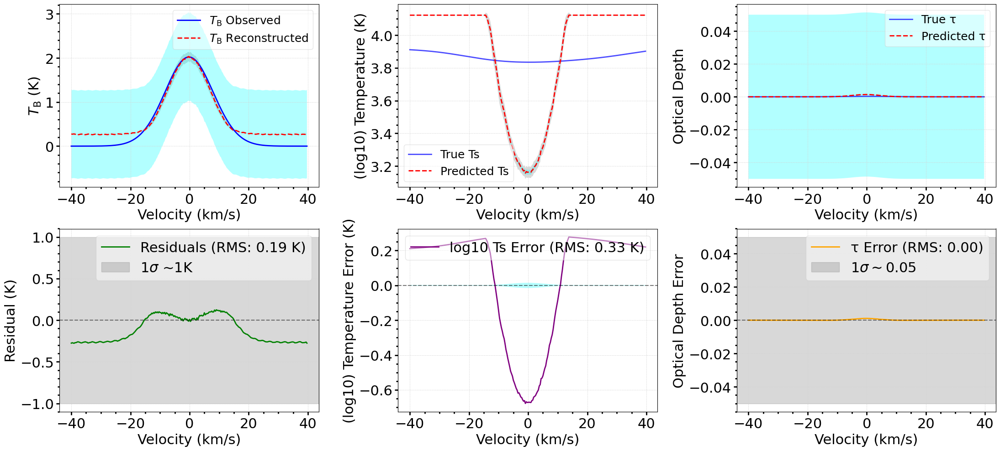

In [ ]:
visu(model, v, test_spectra, test_tauspectra, test_tempspectra, device, test_idx = 55)

Generating visualization...
test spectrum idx:  7


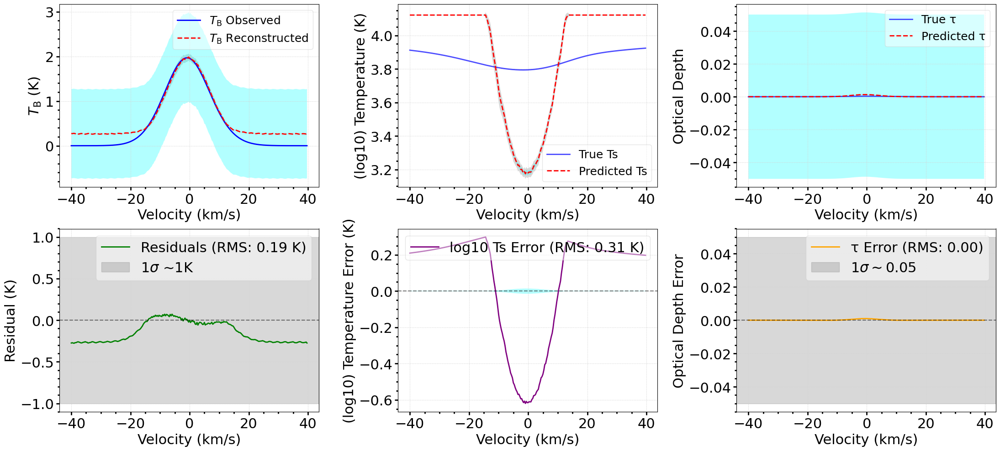

In [ ]:
visu(model, v, test_spectra, test_tauspectra, test_tempspectra, device, test_idx = 7)

Generating visualization...
test spectrum idx:  77


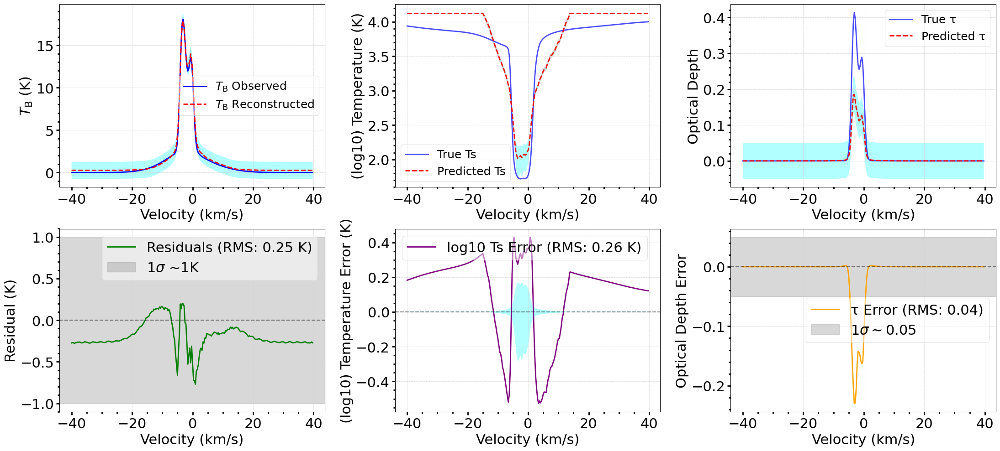

In [ ]:
visu(model, v, test_spectra, test_tauspectra, test_tempspectra, device, test_idx = 77)

# Cases with high TB

Generating visualization...
test spectrum idx:  9


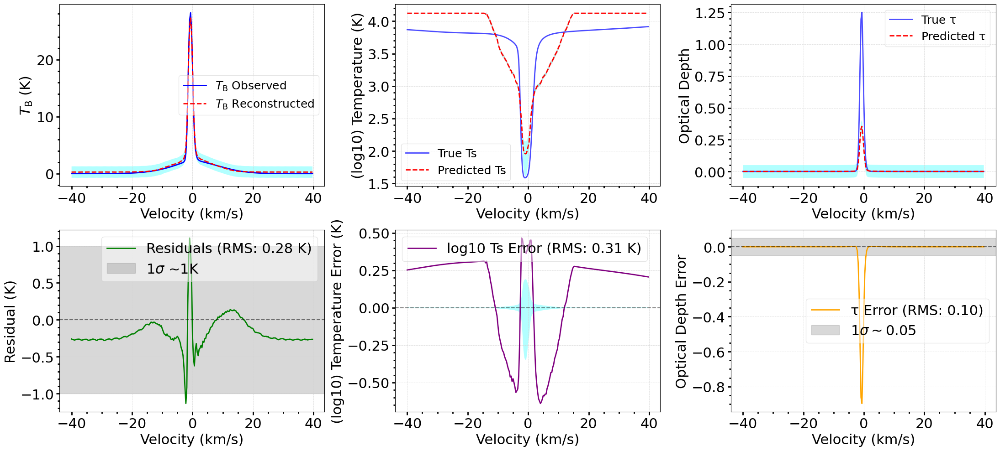

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[0]
visu(model, v, test_spectra, test_tauspectra, test_tempspectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  11


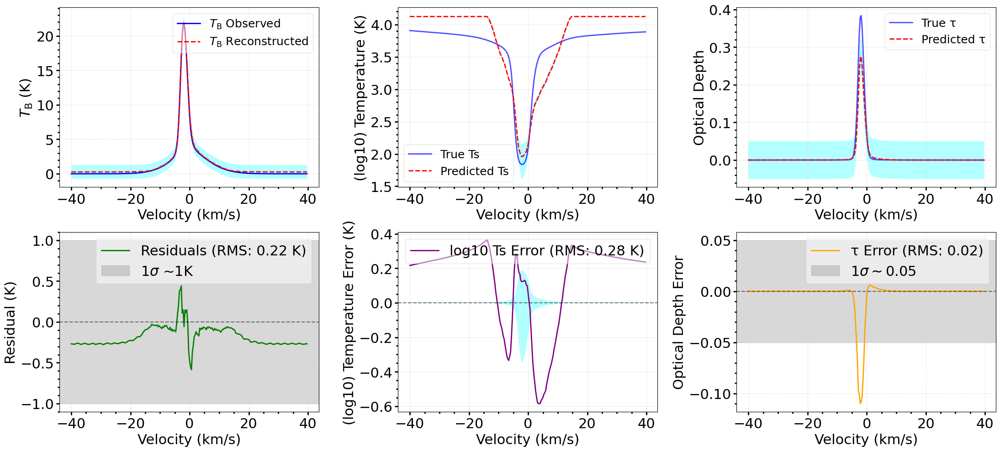

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[1]
visu(model, v, test_spectra, test_tauspectra, test_tempspectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  33


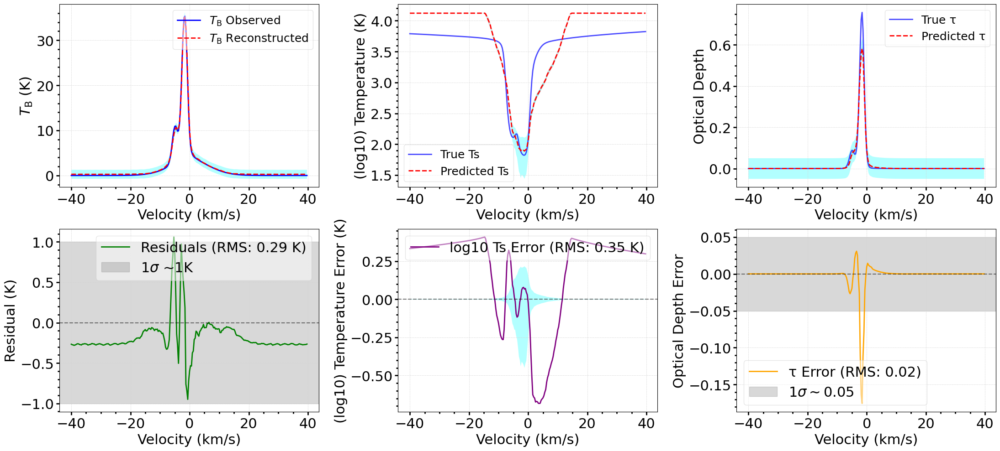

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[2]
visu(model, v, test_spectra, test_tauspectra, test_tempspectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  52


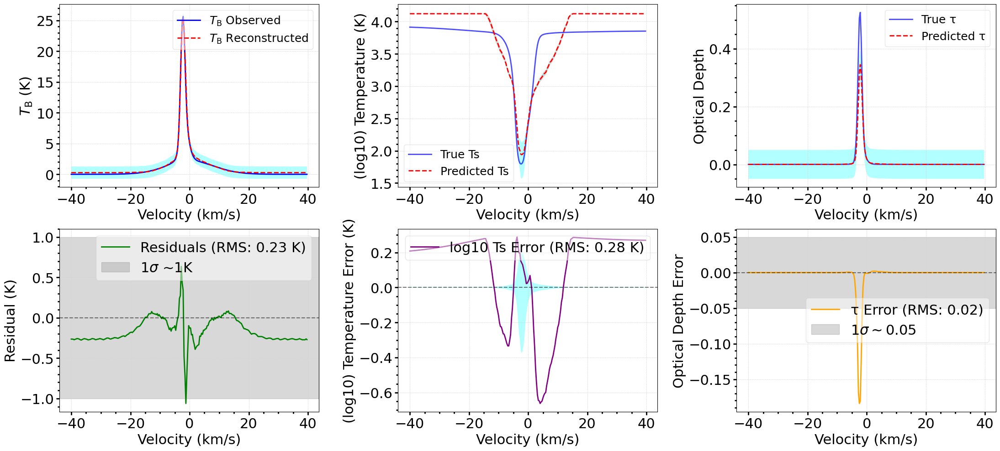

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[4]
visu(model, v, test_spectra, test_tauspectra, test_tempspectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  74


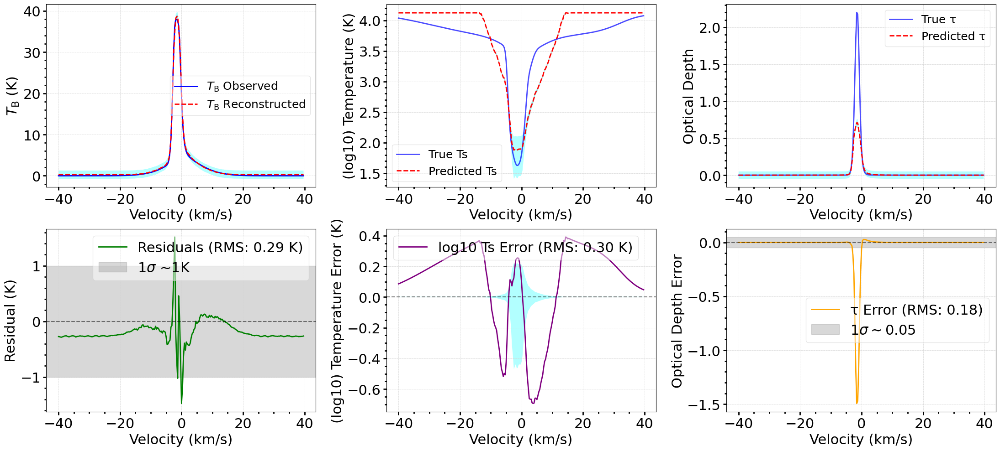

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[5]
visu(model, v, test_spectra, test_tauspectra, test_tempspectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  112


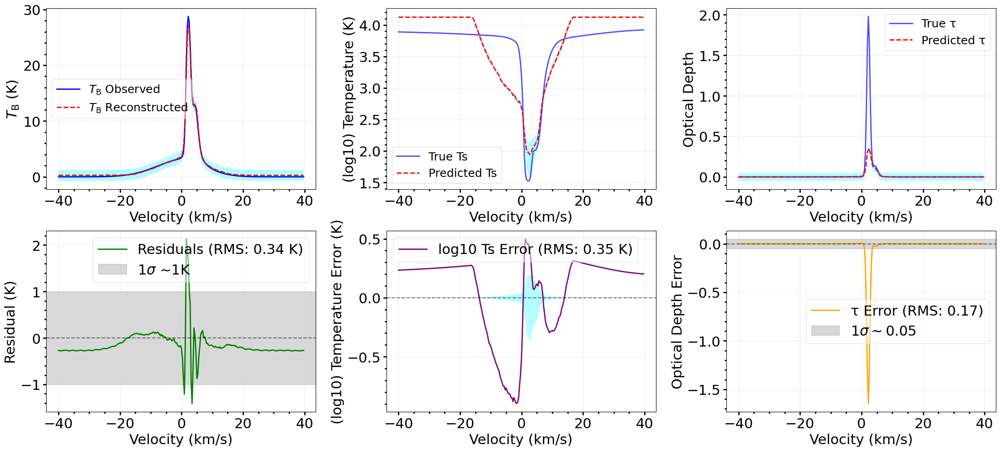

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[6]
visu(model, v, test_spectra, test_tauspectra, test_tempspectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  122


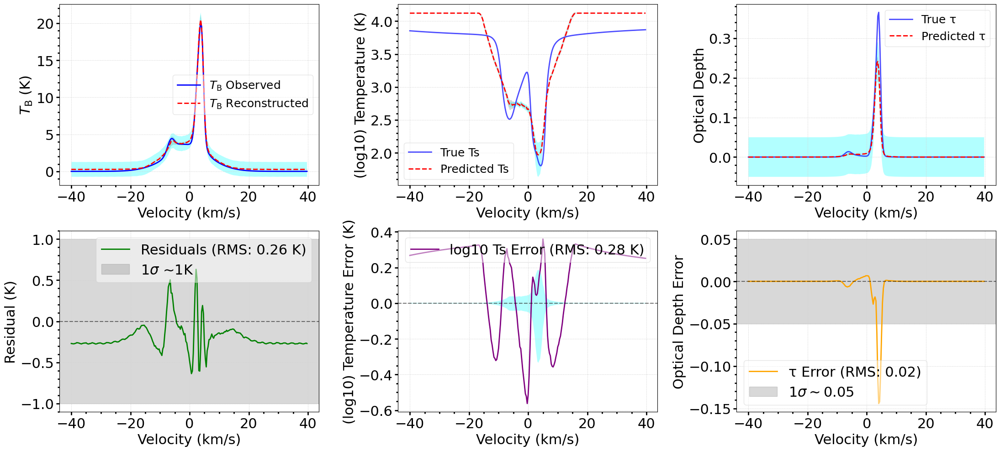

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[7]
visu(model, v, test_spectra, test_tauspectra, test_tempspectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  173


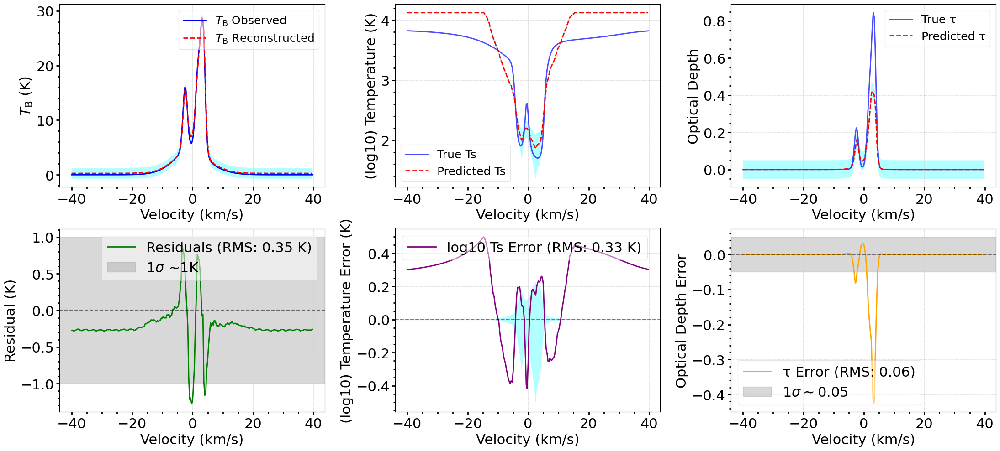

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[10]
visu(model, v, test_spectra, test_tauspectra, test_tempspectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  247


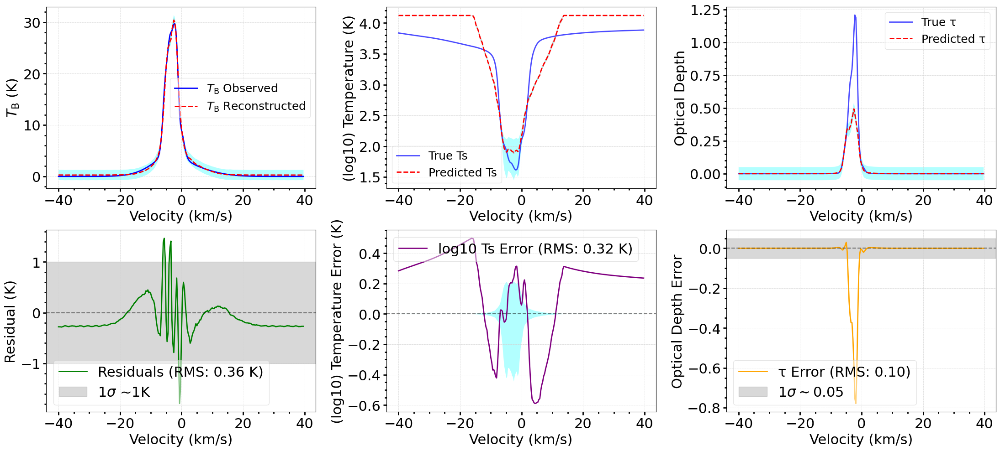

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[15]
visu(model, v, test_spectra, test_tauspectra, test_tempspectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  340


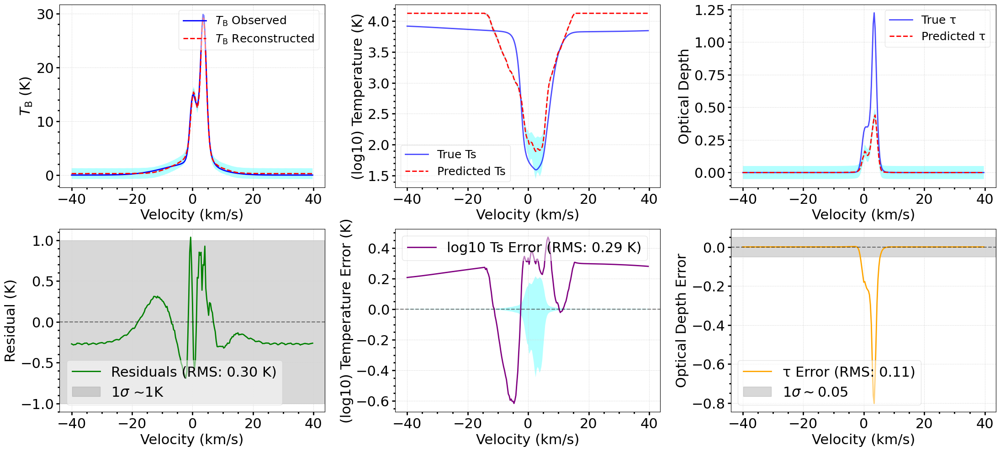

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[22]
visu(model, v, test_spectra, test_tauspectra, test_tempspectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  429


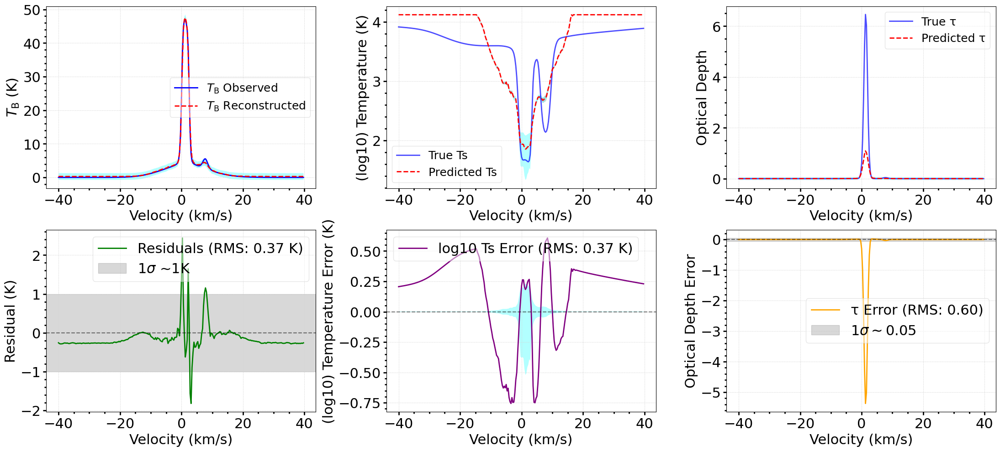

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[30]
visu(model, v, test_spectra, test_tauspectra, test_tempspectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  503


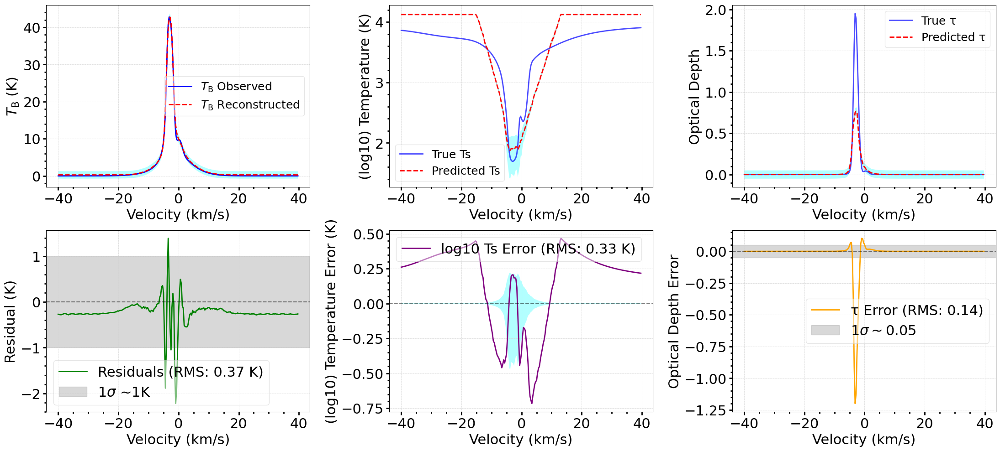

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[35]
visu(model, v, test_spectra, test_tauspectra, test_tempspectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  583


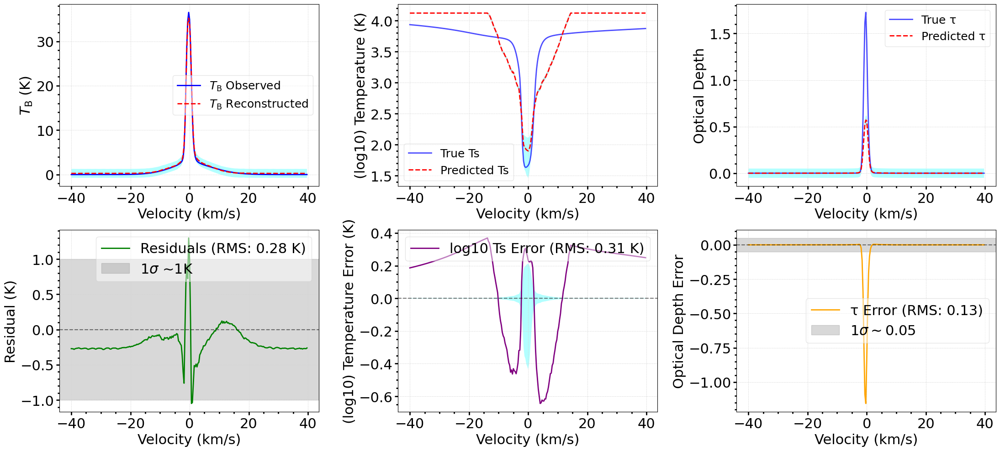

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[40]
visu(model, v, test_spectra, test_tauspectra, test_tempspectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  652


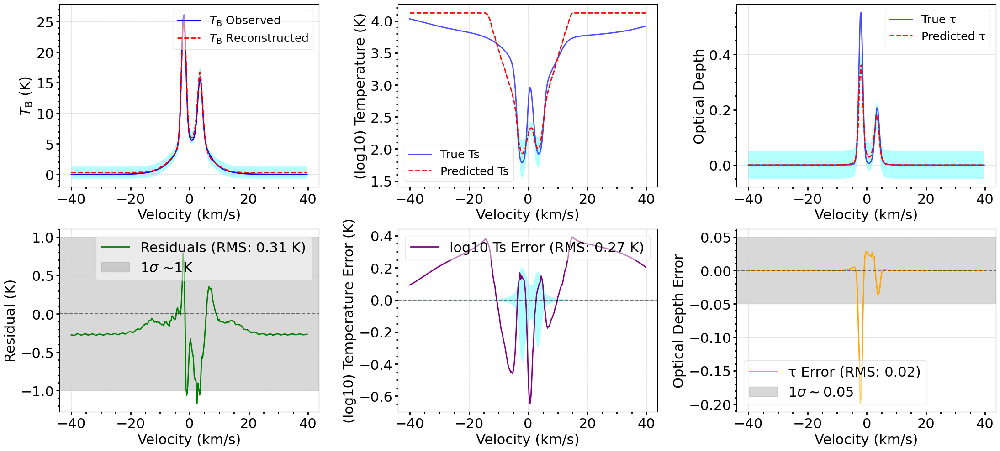

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[45]
visu(model, v, test_spectra, test_tauspectra, test_tempspectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  715


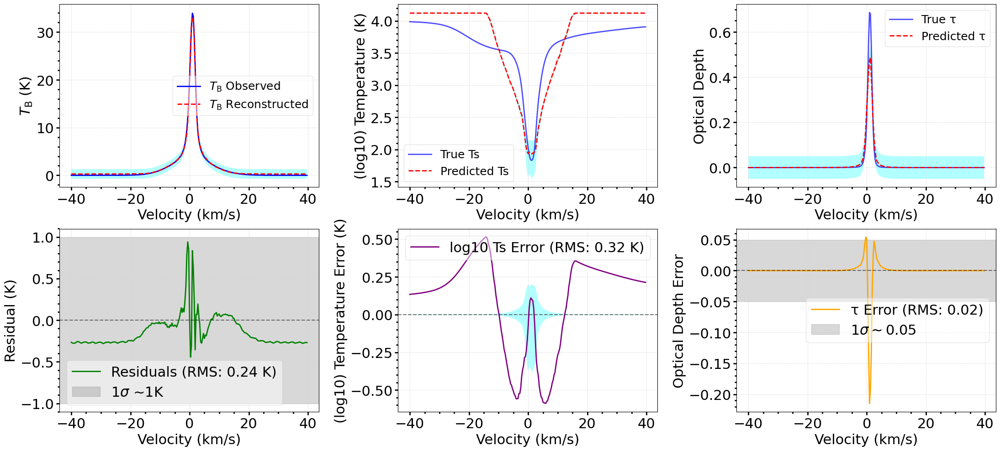

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[50]
visu(model, v, test_spectra, test_tauspectra, test_tempspectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  763


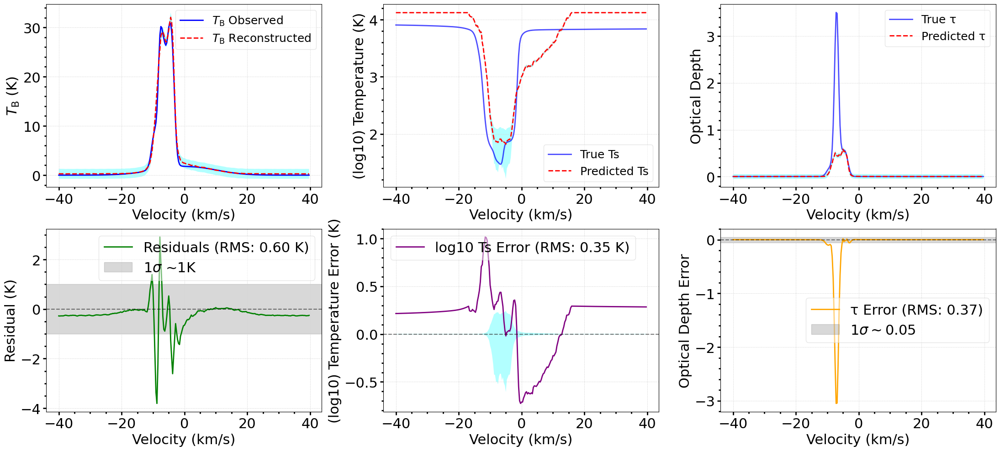

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[55]
visu(model, v, test_spectra, test_tauspectra, test_tempspectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  854


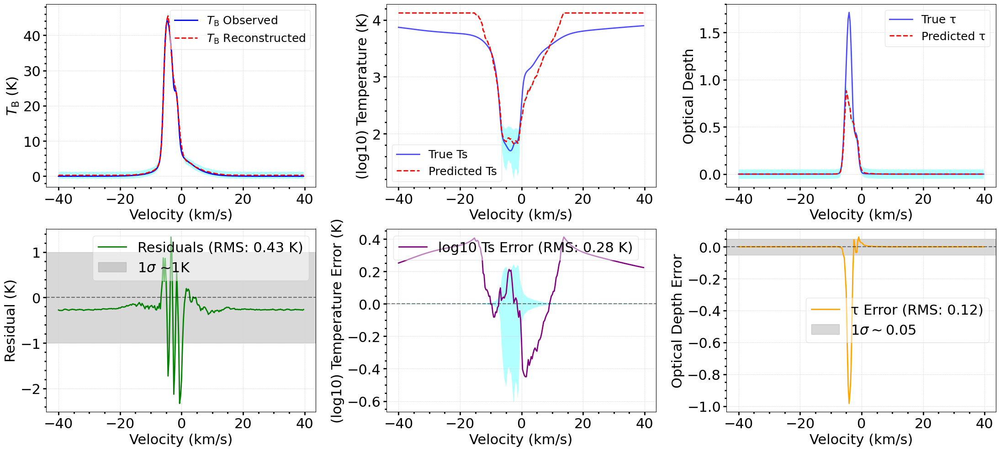

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[60]
visu(model, v, test_spectra, test_tauspectra, test_tempspectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  920


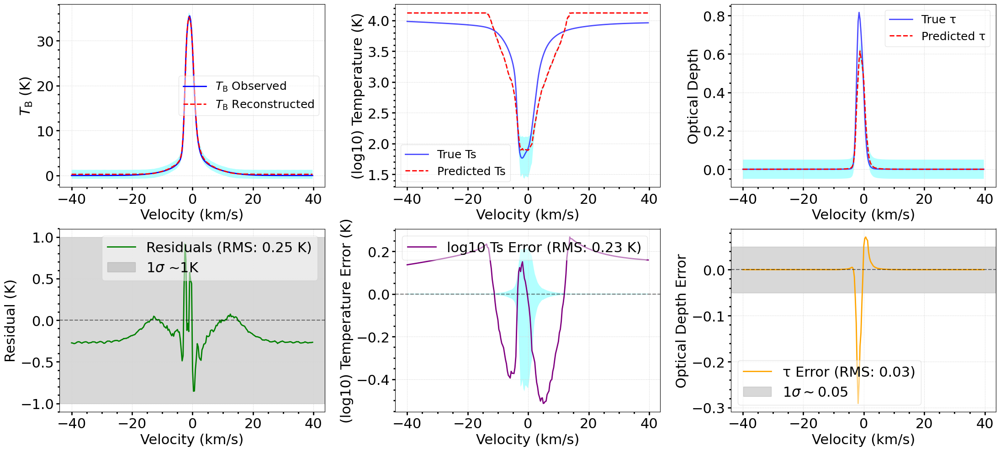

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[65]
visu(model, v, test_spectra, test_tauspectra, test_tempspectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  1076


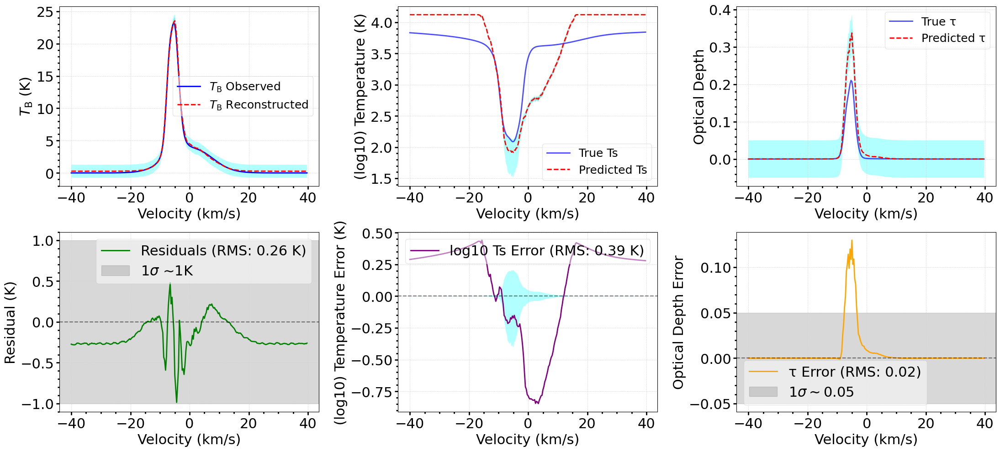

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[70]
visu(model, v, test_spectra, test_tauspectra, test_tempspectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  1172


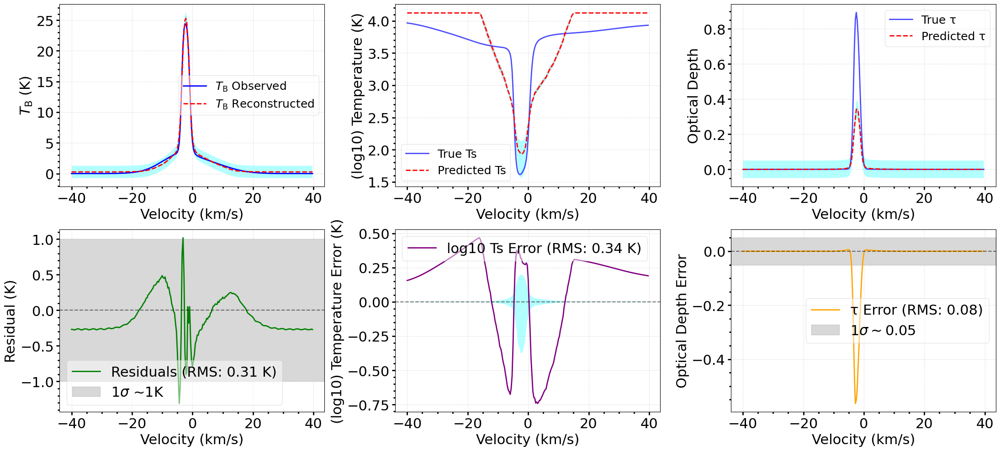

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[84]
visu(model, v, test_spectra, test_tauspectra, test_tempspectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  1563


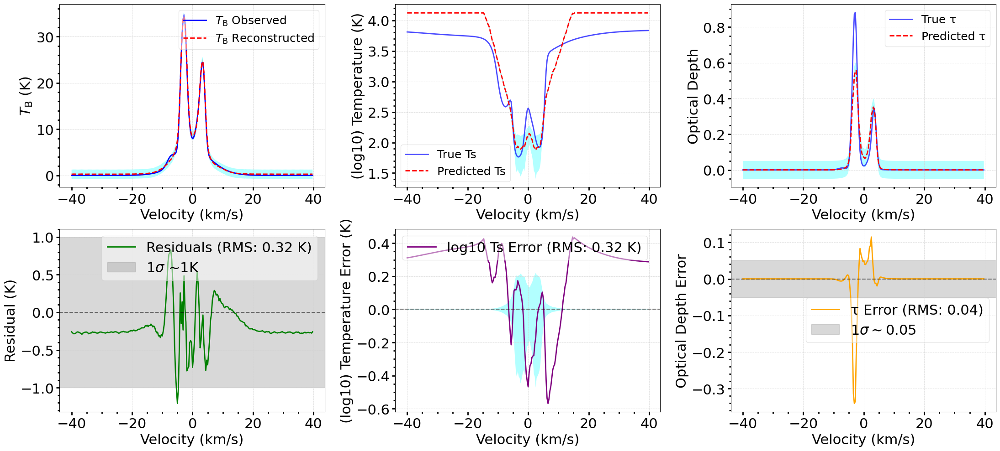

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[125]
visu(model, v, test_spectra, test_tauspectra, test_tempspectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  1803


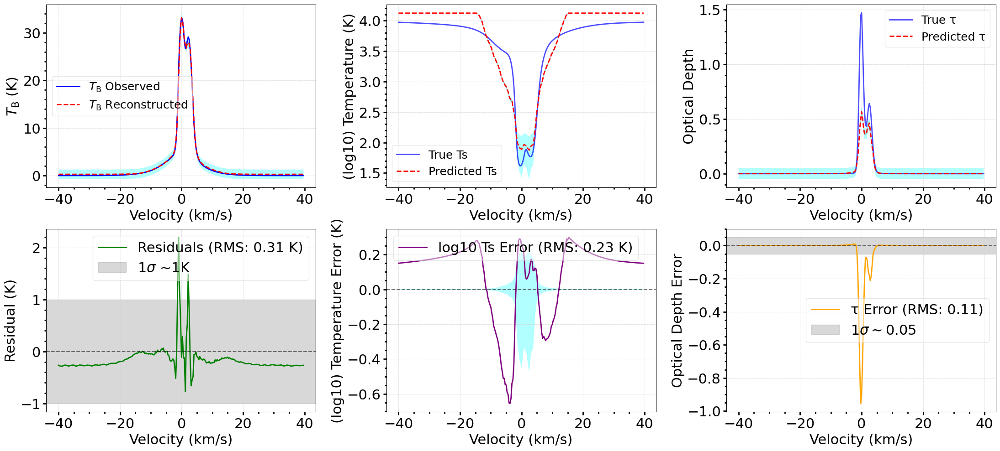

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[150]
visu(model, v, test_spectra, test_tauspectra, test_tempspectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  541


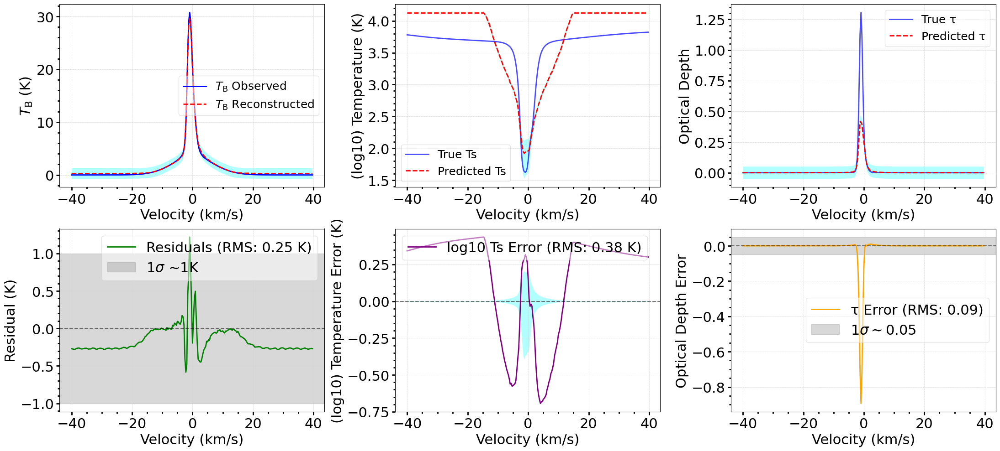

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[37]
visu(model, v, test_spectra, test_tauspectra, test_tempspectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  425


/jobfs/155627206.gadi-pbs/ipykernel_2578373/2401958787.py:61: RuntimeWarning: invalid value encountered in log10
  log10_lower_bound_linear50 = np.log10(lower_bound_linear50)


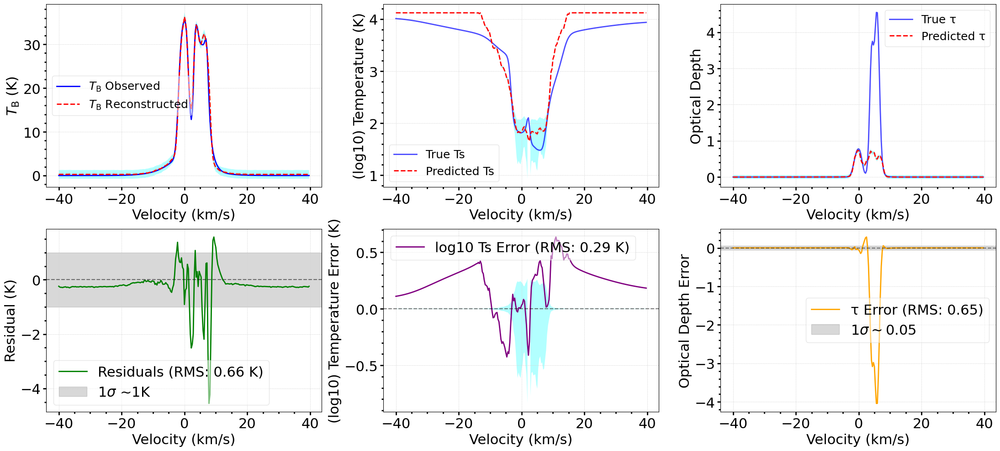

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[29]
visu(model, v, test_spectra, test_tauspectra, test_tempspectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  966


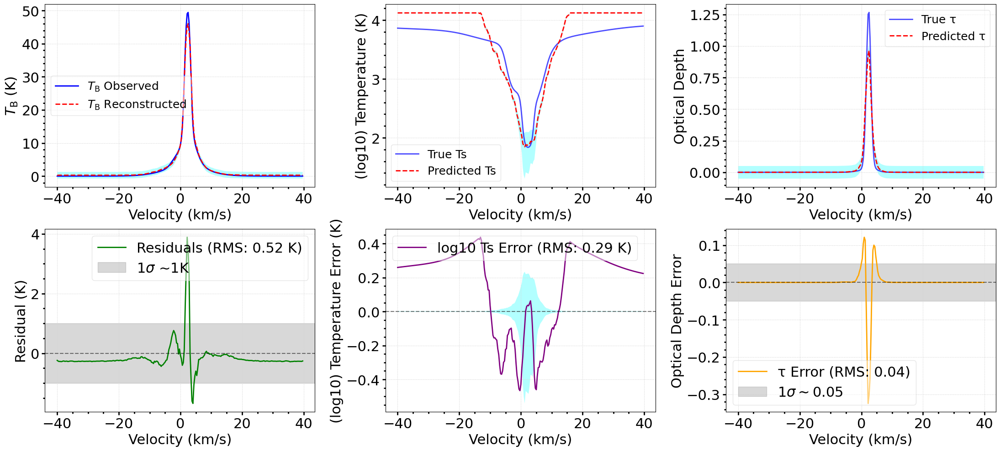

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[67]
visu(model, v, test_spectra, test_tauspectra, test_tempspectra, device, test_idx = test_idx)

# Plots without residuals

In [ ]:
from scipy.interpolate import UnivariateSpline, interp1d

def estimate_uncertainty(temperature_spectrum):
    """
    Estimate smooth uncertainty envelope for temperature spectrum using linear interpolation.

    Parameters:
    -----------
    temperature_spectrum : array-like
        Temperature values in Kelvin

    Returns:
    --------
    uncertainty : numpy array
        Smoothly interpolated uncertainty values corresponding to each temperature
    """
    temperature = np.array(temperature_spectrum)

    # Define key control points: (temperature, uncertainty)
    temp_points = np.array([3, 100, 300, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000])
    unc_points  = np.array([50, 50,  200, 600, 800, 900, 1000, 1500, 2000, 3000, 4000, 5000, 6000])

    interpolator = interp1d(temp_points, unc_points, kind='linear',
                           bounds_error=False, fill_value='extrapolate')
    uncertainty = interpolator(temperature)

    return uncertainty

In [ ]:
def visu1(model, v, test_spectra, test_tauspectra, test_tempspectra, device, test_idx = 0):
    # Visualize results on a test spectrum
    print("Generating visualization...")
    print('test spectrum idx: ', test_idx)

    test_spectrum = test_spectra[test_idx]  # Use first spectrum as test
    test_tauspectrum = test_tauspectra[test_idx]
    test_tempspectrum = test_tempspectra[test_idx]




    """
    Visualize the decomposition results for a single spectrum.

    Args:
        model: Trained model
        test_spectrum: Observed TB spectrum
        T_true: True temperature spectrum (ground truth)
        tau_true: True optical depth spectrum (ground truth)
        velocities: Velocity array
        device: Computing device
    """
    model.eval()
    with torch.no_grad():
        TB_obs = torch.FloatTensor(test_spectrum).unsqueeze(0).to(device)
        T_HI_samples, tau_samples, TB_samples = model.sample_posterior(TB_obs, n_samples=512)

        # Get mean and std for uncertainty quantification
        T_HI, _ = T_HI_samples.median(dim=0)
        T_HI_std = T_HI_samples.std(dim=0)
        tau, _ = tau_samples.median(dim=0)
        tau_std = tau_samples.std(dim=0)

        TB_recon, _ = TB_samples.median(dim=0)
        TB_recon_std = TB_samples.std(dim=0)

        # Move to CPU for plotting
        TB_obs = TB_obs.cpu().numpy()[0]

        T_HI = T_HI.cpu().numpy()[0]
        T_HI_std = T_HI_std.cpu().numpy()[0]

        uncertainty = estimate_uncertainty(T_HI)

        lower_bound_linear = T_HI - uncertainty
        upper_bound_linear = T_HI + uncertainty

        # Ensure bounds are positive before taking log10
        lower_bound_linear[lower_bound_linear <= 0] = 1e-6
        upper_bound_linear[upper_bound_linear <= 0] = 1e-6

        log10_lower_bound = np.log10(lower_bound_linear)
        log10_upper_bound = np.log10(upper_bound_linear)


        T_HI = np.log10(T_HI)
        T_HI_std = np.log10(T_HI_std)

        tau = tau.cpu().numpy()[0]
        tau_std = tau_std.cpu().numpy()[0]

        TB_recon = TB_recon.cpu().numpy()[0]
        TB_recon_std = TB_recon_std.cpu().numpy()[0]
    # End - with




    # Plots
    fig, axes = plt.subplots(1, 3, figsize=(22, 6))

    fontsize = 29
    lgsize = 26

    # xlims
    x1 = -20.
    x2 = 30.

    lw=3

    # Plot 1: Observed vs Reconstructed
    ax = axes[0]
    ax.plot(v, TB_obs, 'b-', label=r'Observed $T_\mathrm{b}$', linewidth=lw+1)
    ax.plot(v, TB_recon, 'r--', label=r'Reconstructed $T_\mathrm{b}$', linewidth=lw)
    ax.fill_between(v, TB_recon-TB_recon_std, TB_recon+TB_recon_std, alpha=0.3, facecolor='grey')
    ax.fill_between(v, TB_recon-1., TB_recon+1., alpha=0.3, facecolor='cyan')
    ax.set_xlabel(r'Velocity [km s$^{-1}$]', fontsize=fontsize)
    ax.set_ylabel(r'$T_\mathrm{b}$ [K]', fontsize=fontsize)

    ax.minorticks_on()
    ax.tick_params(axis='x', labelsize=fontsize, pad=4)
    ax.tick_params(axis='y', labelsize=fontsize)
    ax.tick_params(which='both', width=2)
    ax.tick_params(which='major', length=5)
    ax.tick_params(which='minor', length=3)

    ax.set_xlim(x1, x2)

    ax.legend(fancybox=True, loc='upper right', framealpha=0.5, labelcolor='k', fontsize=lgsize)
    ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray', zorder=-10)



    # Plot 3: Predicted vs True Temperature
    ax = axes[1]
    ax.plot(v, test_tempspectrum, 'b-', label=r'True $T_\text{s}$', linewidth=lw+1, alpha=0.7)
    ax.plot(v, T_HI, 'r--', label=r'Inferred $T_\text{s}$', linewidth=lw)
    ax.fill_between(v, log10_lower_bound, log10_upper_bound, alpha=0.3, facecolor='cyan')
    ax.set_xlabel(r'Velocity [km s$^{-1}$]', fontsize=fontsize)
    ax.set_ylabel('log10 (temperature) [K]', fontsize=fontsize)

    ax.minorticks_on()
    ax.tick_params(axis='x', labelsize=fontsize, pad=4)
    ax.tick_params(axis='y', labelsize=fontsize)
    ax.tick_params(which='both', width=2)
    ax.tick_params(which='major', length=5)
    ax.tick_params(which='minor', length=3)

    ax.set_xlim(x1, x2)
    ax.set_ylim(0.35, 4.5)

    ax.legend(fancybox=True, framealpha=0.5, labelcolor='k', fontsize=lgsize)
    ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray', zorder=-10)




    # Plot 4: Predicted vs True Optical Depth
    ax = axes[2]
    ax.plot(v, test_tauspectrum, 'b-', label='True τ', linewidth=lw+1, alpha=0.7)
    ax.plot(v, tau, 'r--', label='Inferred τ', linewidth=lw)
    ax.fill_between(v, tau-tau_std, tau+tau_std, alpha=0.3, facecolor='grey')
    ax.fill_between(v, tau-0.05, tau+0.05, alpha=0.3, facecolor='cyan')
    ax.set_xlabel(r'Velocity [km s$^{-1}$]', fontsize=fontsize)
    ax.set_ylabel(r'Optical depth τ', fontsize=fontsize)

    ax.minorticks_on()
    ax.tick_params(axis='x', labelsize=fontsize, pad=4)
    ax.tick_params(axis='y', labelsize=fontsize)
    ax.tick_params(which='both', width=2)
    ax.tick_params(which='major', length=5)
    ax.tick_params(which='minor', length=3)

    ax.set_xlim(x1, x2)

    ax.legend(fancybox=True, framealpha=0.1, labelcolor='k', fontsize=lgsize)
    ax.grid(True, linestyle='--', linewidth=0.5, color='lightgray', zorder=-10)

    ###
    plt.subplots_adjust(left=None,
                    bottom=None,
                    right=None,
                    top=None,
                    wspace=0.9,
                    hspace=0.0
                    )

    plt.tight_layout()
    plt.savefig(img_path / f'res{test_idx}.png', dpi=300, bbox_inches='tight')
    plt.show()

Generating visualization...
test spectrum idx:  652


/jobfs/155627206.gadi-pbs/ipykernel_2578373/2784934681.py:68: RuntimeWarning: divide by zero encountered in log10
  T_HI_std = np.log10(T_HI_std)


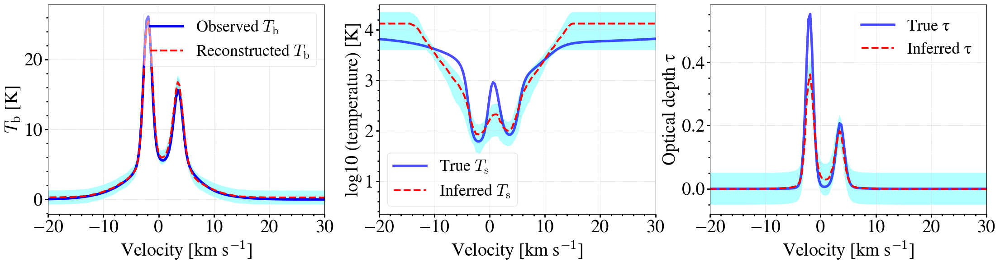

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[45]
visu1(model, v, test_spectra, test_tauspectra, test_tempspectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  321


/jobfs/155627206.gadi-pbs/ipykernel_2578373/2784934681.py:68: RuntimeWarning: divide by zero encountered in log10
  T_HI_std = np.log10(T_HI_std)


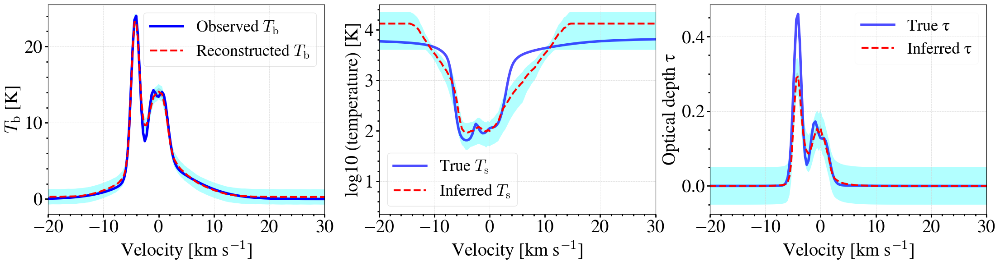

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[21]
visu1(model, v, test_spectra, test_tauspectra, test_tempspectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  1080


/jobfs/155627206.gadi-pbs/ipykernel_2578373/2784934681.py:68: RuntimeWarning: divide by zero encountered in log10
  T_HI_std = np.log10(T_HI_std)


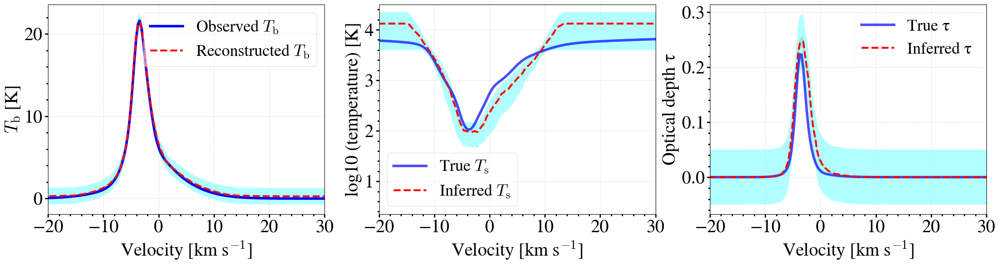

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[72]
visu1(model, v, test_spectra, test_tauspectra, test_tempspectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  1120


/jobfs/155627206.gadi-pbs/ipykernel_2578373/2784934681.py:68: RuntimeWarning: divide by zero encountered in log10
  T_HI_std = np.log10(T_HI_std)


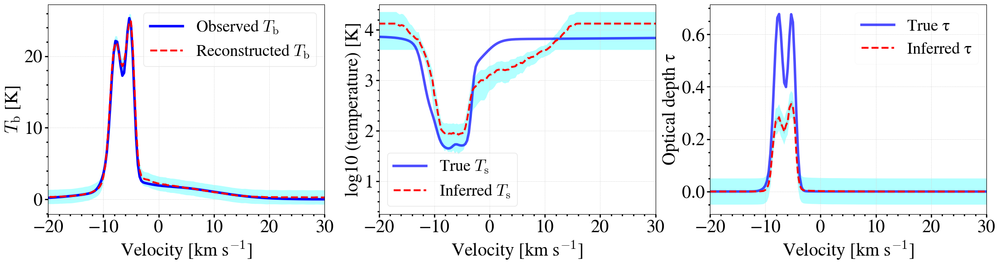

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[79]
visu1(model, v, test_spectra, test_tauspectra, test_tempspectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  1262


/jobfs/155627206.gadi-pbs/ipykernel_2578373/2784934681.py:68: RuntimeWarning: divide by zero encountered in log10
  T_HI_std = np.log10(T_HI_std)


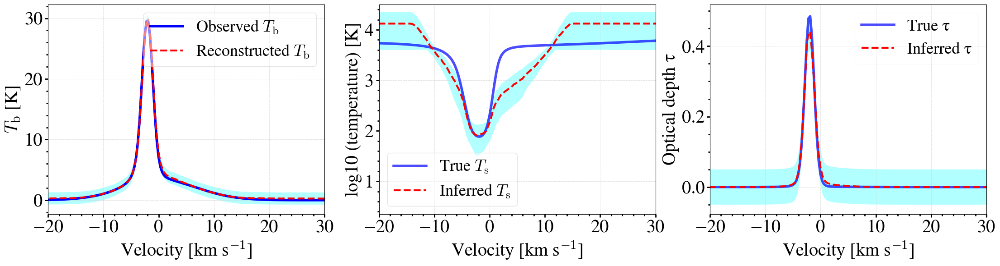

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[95]
visu1(model, v, test_spectra, test_tauspectra, test_tempspectra, device, test_idx = test_idx)

Generating visualization...
test spectrum idx:  1322


/jobfs/155627206.gadi-pbs/ipykernel_2578373/2784934681.py:68: RuntimeWarning: divide by zero encountered in log10
  T_HI_std = np.log10(T_HI_std)


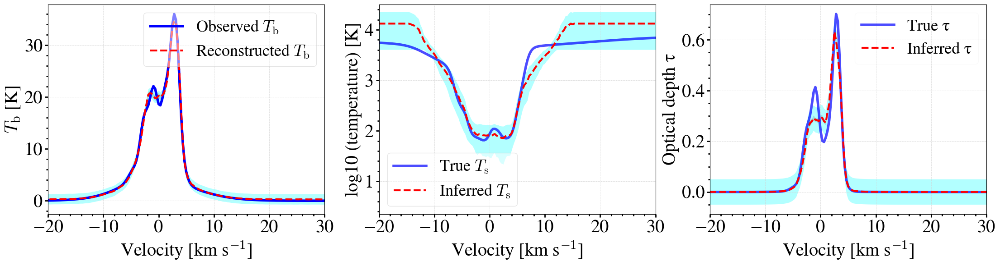

In [ ]:
# Visualize results on a test spectrum
test_idx = sel_idx[101]
visu1(model, v, test_spectra, test_tauspectra, test_tempspectra, device, test_idx = test_idx)